In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as pl
from mpl_toolkits.mplot3d.axes3d import Axes3D

from PIL import Image
import functions
from GP import GP
from GP_grad import GP_grad
import time
import imageio

In [2]:
Noise = True # Specify if noisy or not
Noise_level = 0.01 # if noisy, what is the noise sd
'''If use the scaled X and Y, rememeber to scale the noise as well'''

'If use the scaled X and Y, rememeber to scale the noise as well'

In [3]:
objective = functions.sincos(Noise, Noise_level)
# objective = functions.sin(Noise, Noise_level)

bounds = np.array([item[1] for item in sorted(objective.bounds.items(), key=lambda x: x[0])], dtype=np.float64)
print(bounds) 

f = objective.func
print(f( np.array([2, 1]) ))
# np.sin(np.array([2, 1]))

dim = objective.input_dim
print('dim: ', dim)

[[ 2. 10.]
 [ 2. 10.]]
[0.34797429]
dim:  2


In [4]:
# set seed
seed = 0
# Acq_names=['PI','PG','EI','EG','gp_ucb','random','TS','SATS','G_ES','MES']
acquation_function = 'random'

In [5]:
def draw(n_random_draws=3):
    """ samples some points"""
    # np.random.seed(seed) 
    # should draw randomly
    X = np.random.uniform(bounds[:, 0], bounds[:, 1], size=(n_random_draws, dim))
    return X, f(X)

gp = GP_grad(bounds, Noise, Noise_level)

def get_kernel(sample_size=4):
    np.random.seed(seed)
    X = np.asarray(np.random.uniform(bounds[:, 0], bounds[:, 1], size=(sample_size, dim)))
    gp.set_data(X, f(X))
    # gp.optimize()
    gp.fit()
    return gp.get_hyper()

In [6]:
# creating meshgrid to plot over entire range
x1 = np.linspace(2, 10, 100)
x2 = np.linspace(2, 10, 100)

X1, X2 = np.meshgrid(x1, x2)
mesh = np.vstack((X1.flatten(), X2.flatten())).T

In [7]:
mesh

array([[ 2.        ,  2.        ],
       [ 2.08080808,  2.        ],
       [ 2.16161616,  2.        ],
       ...,
       [ 9.83838384, 10.        ],
       [ 9.91919192, 10.        ],
       [10.        , 10.        ]])

In [8]:
from scipy.optimize import minimize
opts = {"maxiter": 200, "maxfun": 200, "disp": False}
# bounds = np.asarray([[2, 10], [2, 10]])  # bounds on x

Space = np.array([])

for u in mesh:
    Space = np.append(Space, f(u))
        
x0 = mesh[np.argmax(Space)]
x0
        
Res = minimize(lambda x: f(x), 
                        x0=x0,
                        bounds=bounds, 
                        method="L-BFGS-B", 
                        options=opts) # L-BFGS-B


# print("minima: ", Res.x)
argmin, minima = np.array(Res.x), f(Res.x)
argmin, minima

(array([4.74747   , 2.96970912]), array([0.2546154]))

In [9]:
get_kernel()
n = 50

# posterior mean and cov
mu, covar = gp.posterior(mesh)
s = np.sqrt(np.diag(covar))
mu = np.squeeze(mu)

Kt = gp.cov_RBF(mesh, mesh, gp.get_hyper())
K_11 = gp.K11(mesh)
K_01 = gp.K01(mesh)

In [10]:
mesh.shape

(10000, 2)

In [11]:
gp.X.shape, gp.y.shape

((4, 2), (4, 1))

In [12]:
K_11.shape, K_01.shape

((10000, 10000), (4, 10000))

In [13]:
def grad_mean(gp, x): # input a fit gp, find the gradient at x
    assert gp.dim == 2
    # partial x1
    gp.set_p(0)
    m1, v1 = gp.posterior_grad(x)
    s1 = np.sqrt(np.diag(v1))
    m1 = np.squeeze(m1)

    # partial x2
    gp.set_p(1)
    m2, v2 = gp.posterior_grad(x)
    s2 = np.sqrt(np.diag(v2))
    m2 = np.squeeze(m2)
    return np.squeeze(np.vstack([m1, m2]))

def grad_TS(gp, x): # input a fit gp, find the gradient at x
    assert gp.dim == 2
    
    M, V = gp.joint_MVN(0, 1, x, x)
    # partial x1
    gp.set_p(0)
    m1, v1 = gp.posterior_grad(x)
    s1 = np.sqrt(np.diag(v1))
    m1 = np.squeeze(m1)

    # partial x2
    gp.set_p(1)
    m2, v2 = gp.posterior_grad(x)
    s2 = np.sqrt(np.diag(v2))
    m2 = np.squeeze(m2)
    return np.squeeze(np.vstack([m1, m2]))


In [14]:
gp = GP_grad(bounds, Noise, Noise_level)
n_iter = 50
np.random.seed(seed=1)  

X = np.asarray(np.random.uniform(bounds[:, 0], bounds[:, 1], size=(4, dim)))
gp.set_data(X, f(X))
gp.fit()
mu, covar = gp.posterior(mesh)

# automated gradient descent
lr_init = 20
alpha = 0.5
 
history = []
history_lr = []

# w: starting point of gd
w = X[0]
grad(gp, w)

array([-7.22220555e-05, -1.20922374e-04])

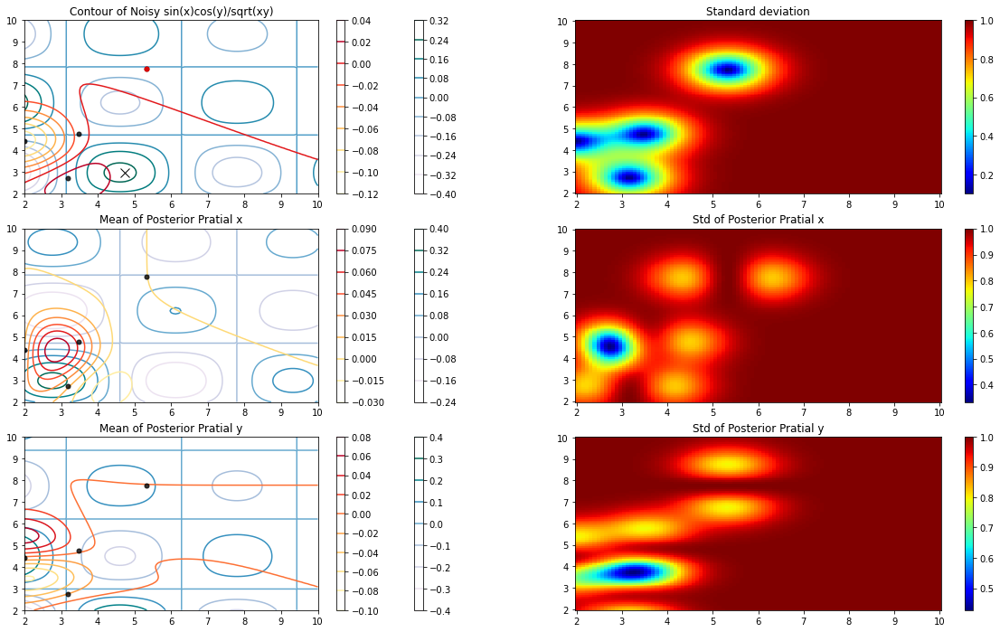

w:  [5.33622118 7.76267152]
f(w) [-0.02250517]
lr:  0.625


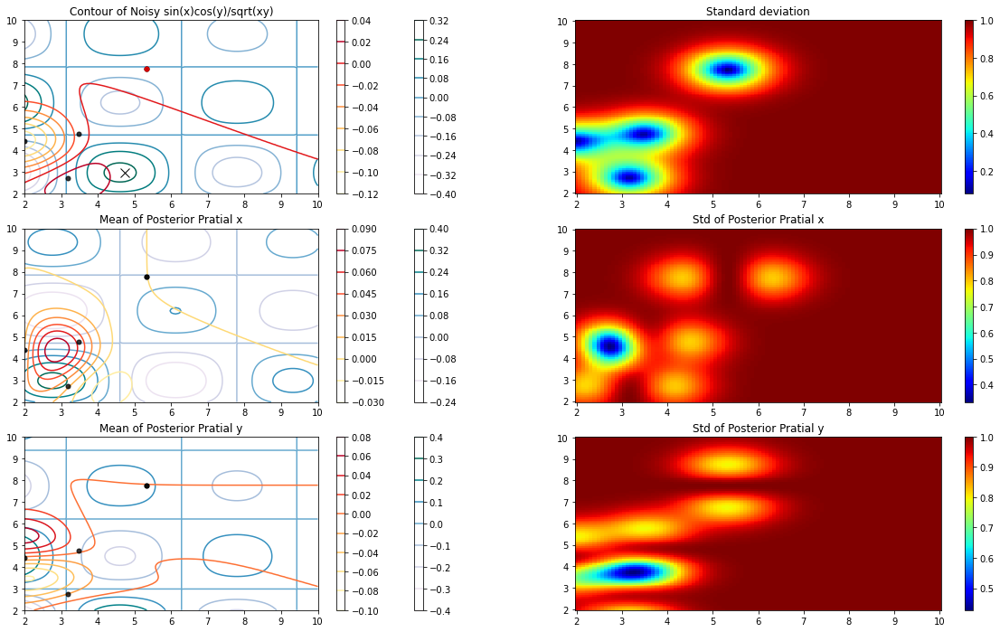

w:  [5.33764719 7.76505911]
f(w) [-0.01802166]
lr:  20


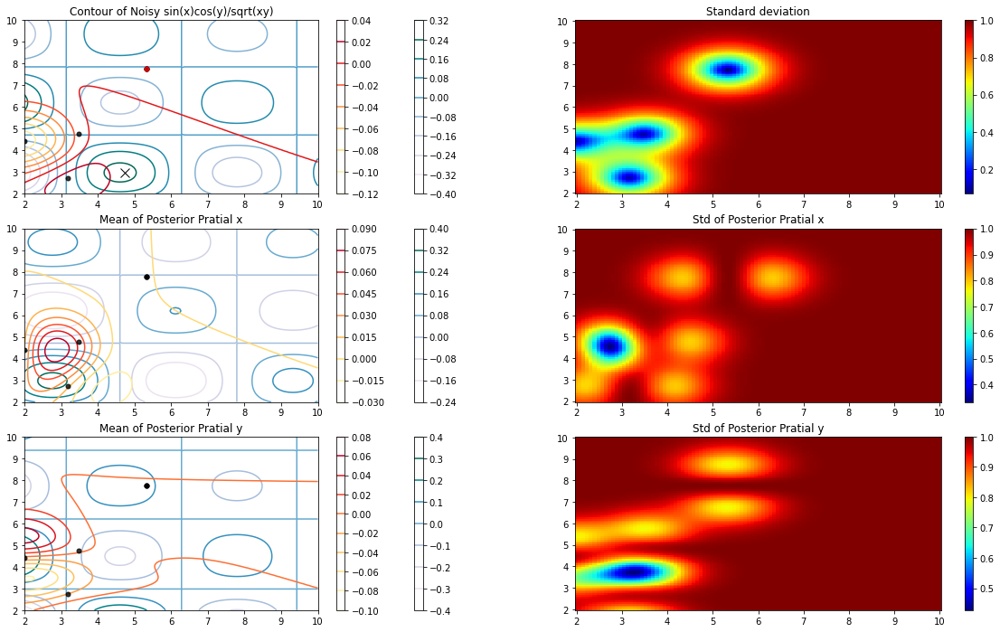

w:  [5.37339564 7.82491289]
f(w) [-0.01045482]
lr:  20


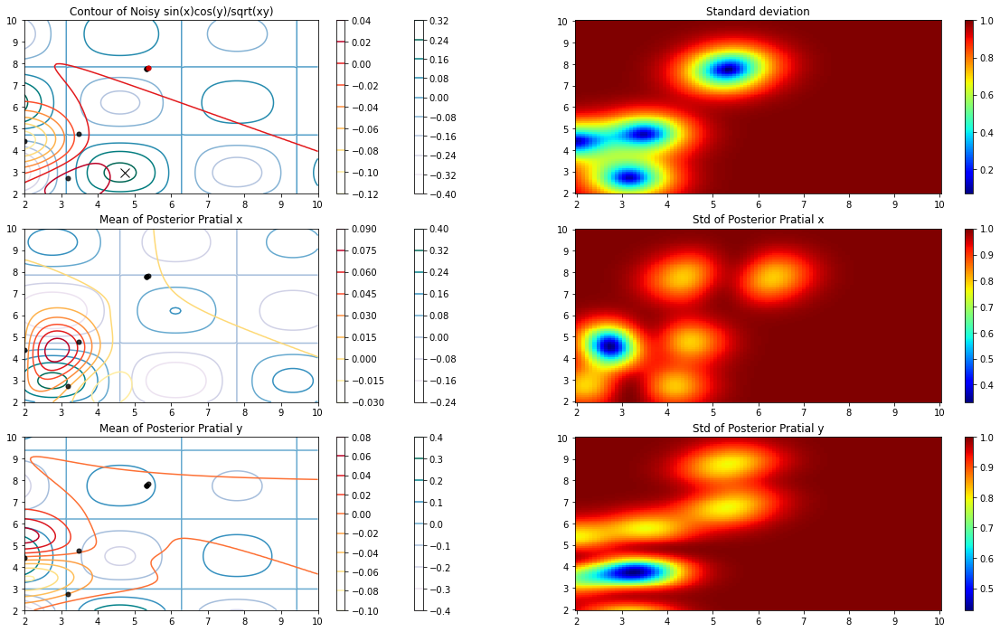

w:  [5.46506803 7.97839623]
f(w) [0.01358957]
lr:  20


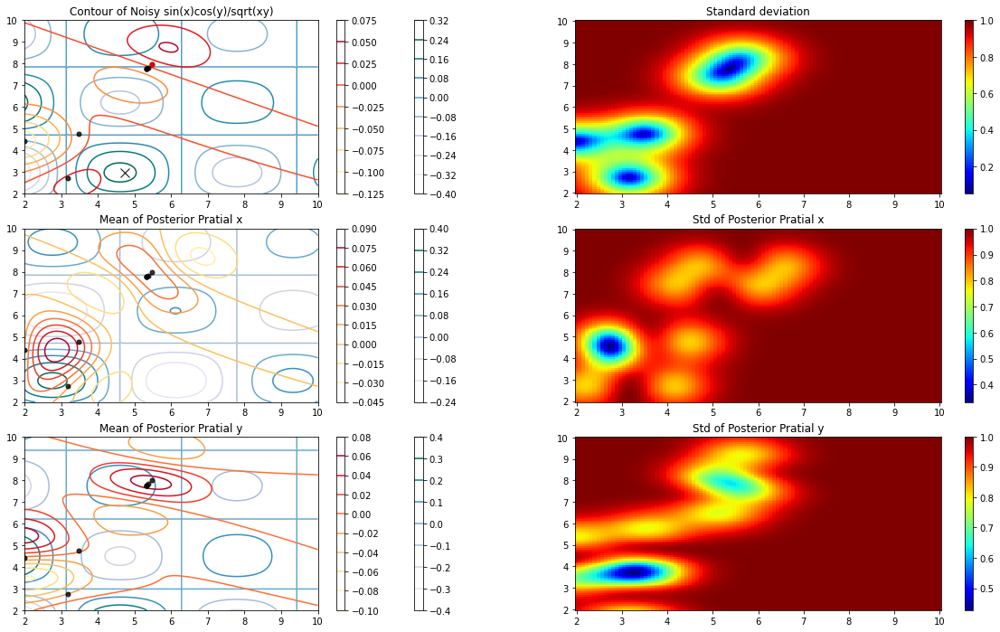

w:  [5.4142566  7.89332467]
f(w) [0.00579615]
lr:  1.25


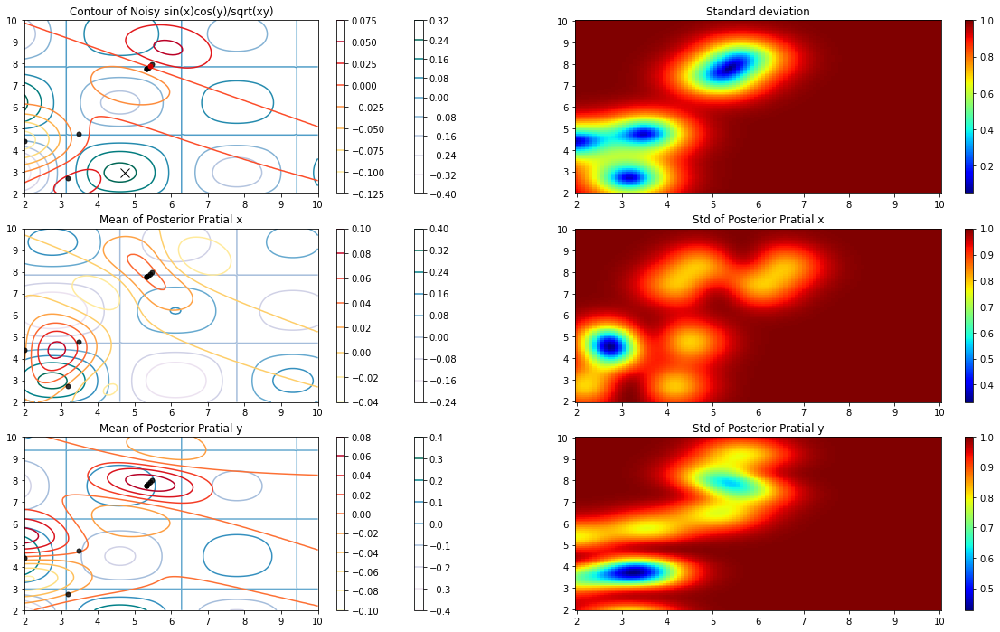

w:  [5.40055562 7.87038562]
f(w) [0.00118768]
lr:  0.3125


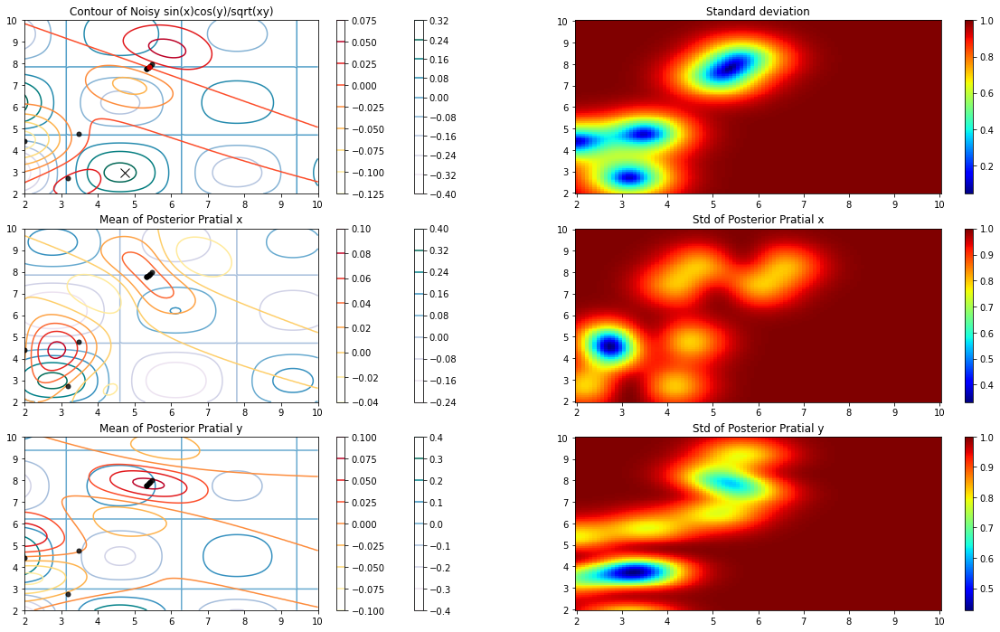

w:  [5.39297196 7.8576885 ]
f(w) [0.00242557]
lr:  0.15625


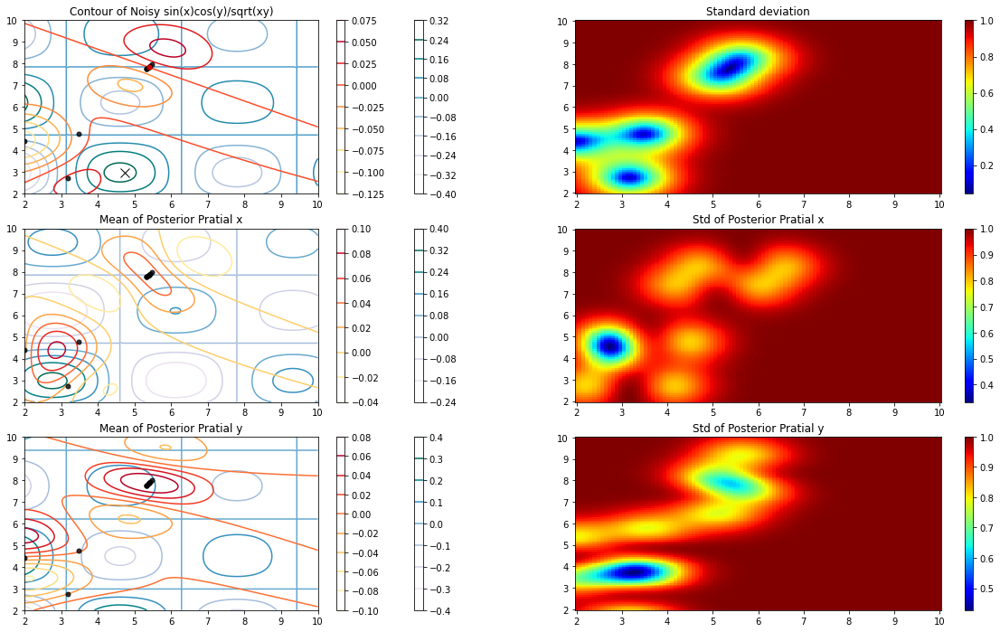

w:  [5.3911341  7.85461142]
f(w) [-0.00946168]
lr:  0.0390625


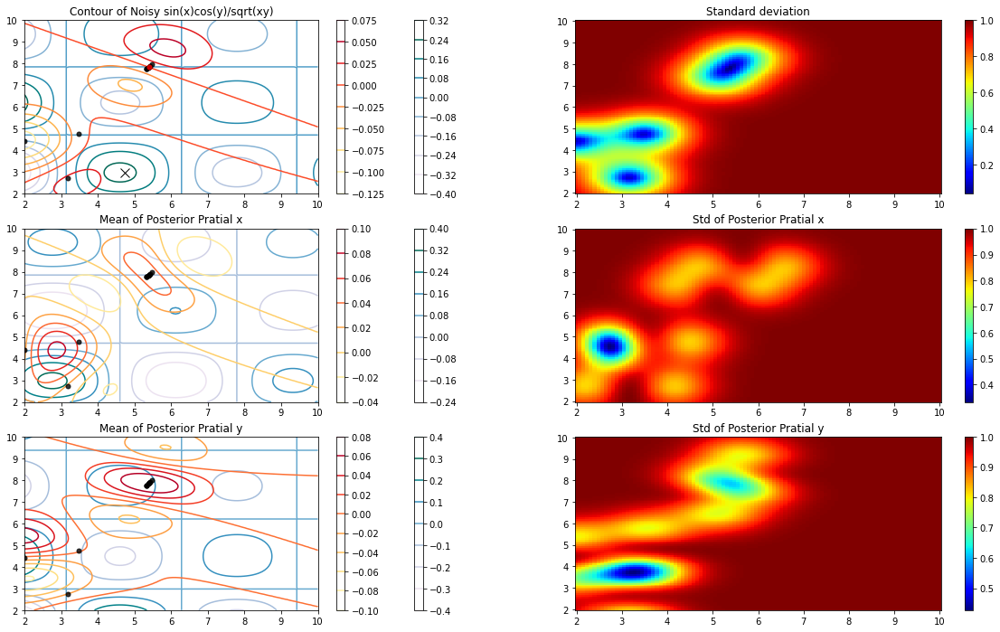

w:  [5.37647072 7.83006099]
f(w) [-0.02148278]
lr:  0.3125


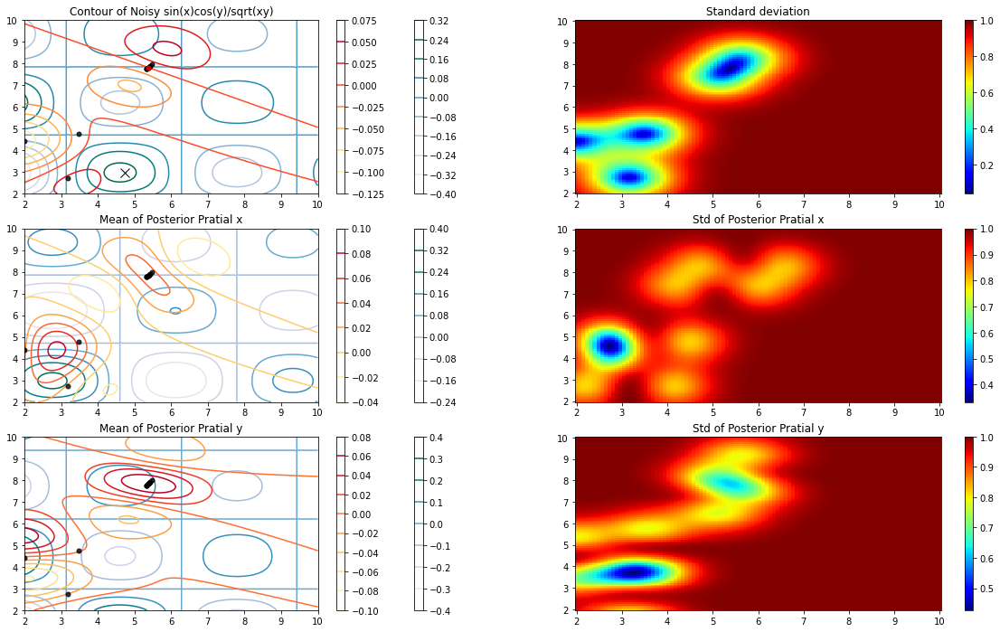

w:  [5.34794587 7.7823025 ]
f(w) [-0.00846799]
lr:  0.625


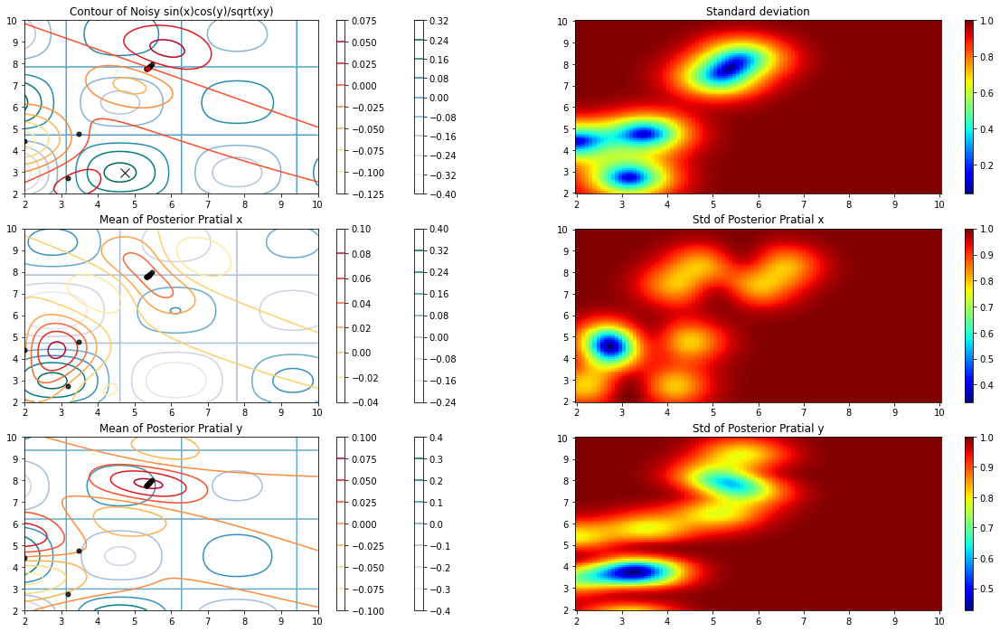

w:  [5.31812303 7.73237097]
f(w) [-0.01113819]
lr:  0.625


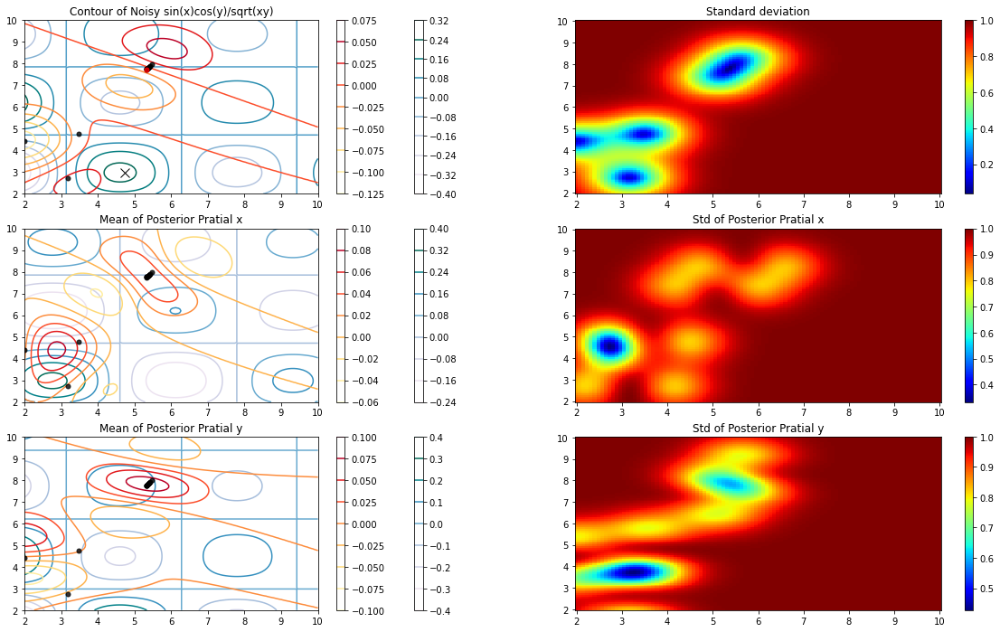

w:  [5.28601805 7.67861873]
f(w) [-0.0419648]
lr:  0.625


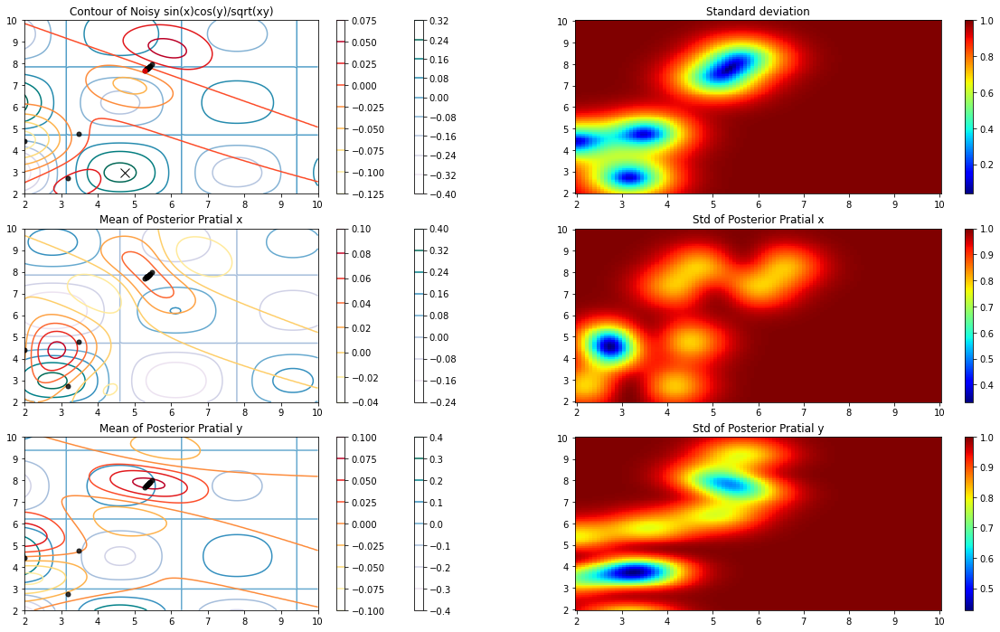

w:  [5.28590532 7.67842999]
f(w) [-0.02703668]
lr:  0.00244140625


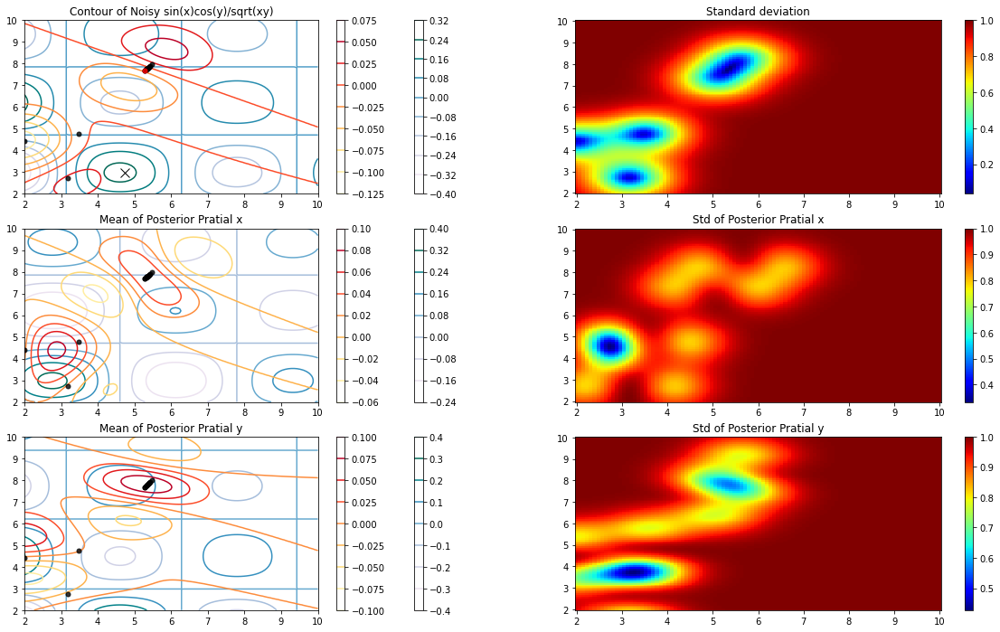

w:  [5.21858951 7.5657261 ]
f(w) [-0.04543384]
lr:  1.25


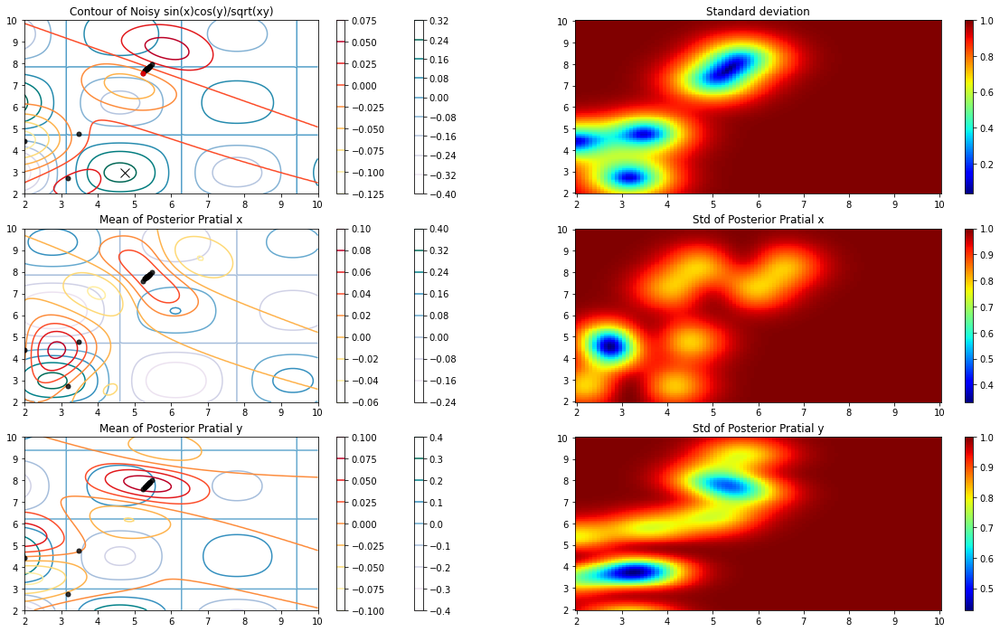

w:  [5.15960952 7.46698051]
f(w) [-0.06028231]
lr:  1.25


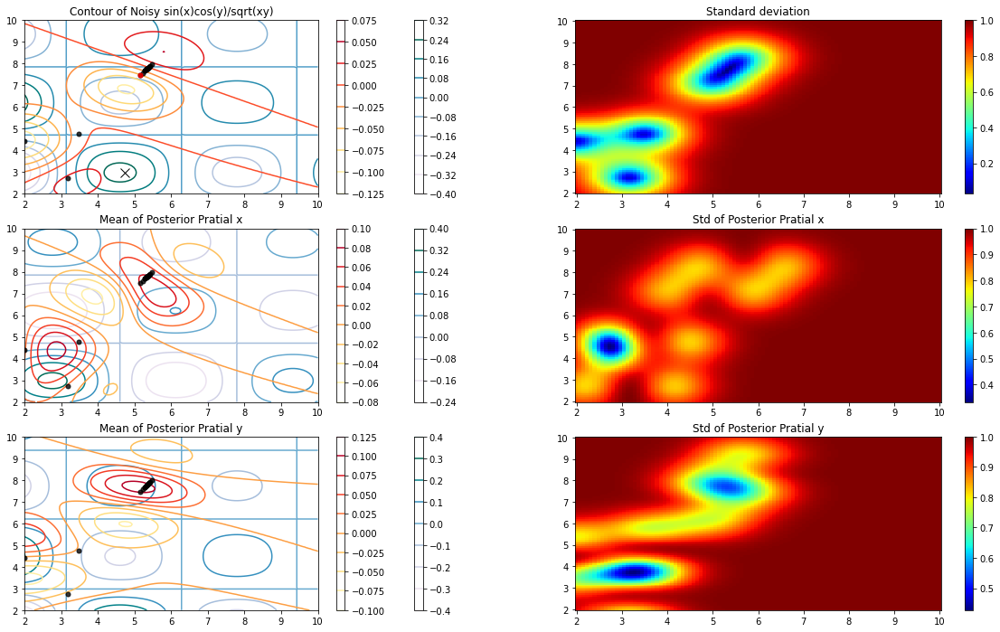

w:  [5.15002035 7.45092677]
f(w) [-0.05060423]
lr:  0.15625


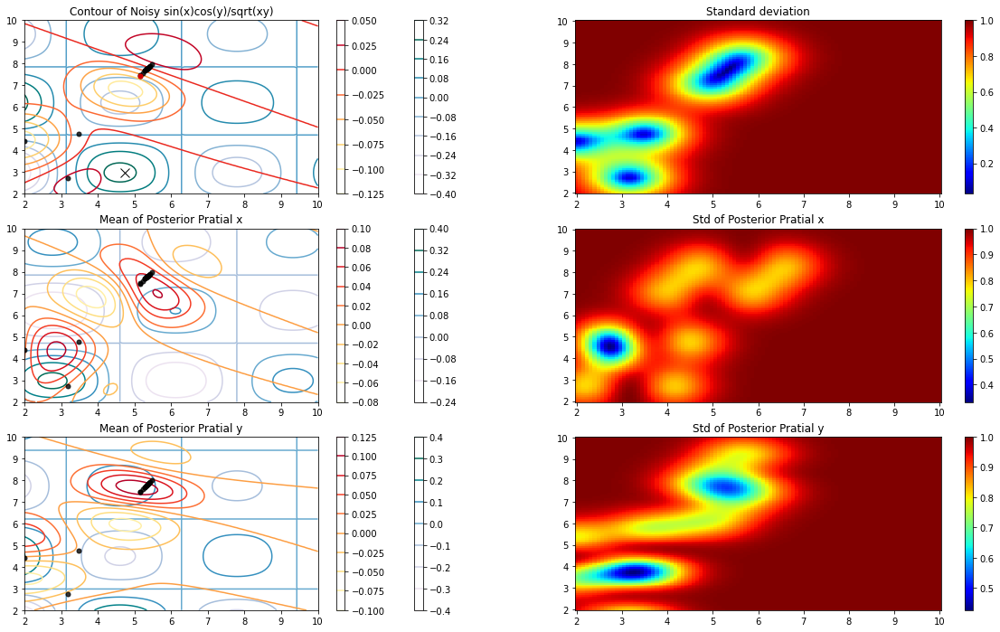

w:  [5.14489029 7.44233832]
f(w) [-0.05585963]
lr:  0.078125


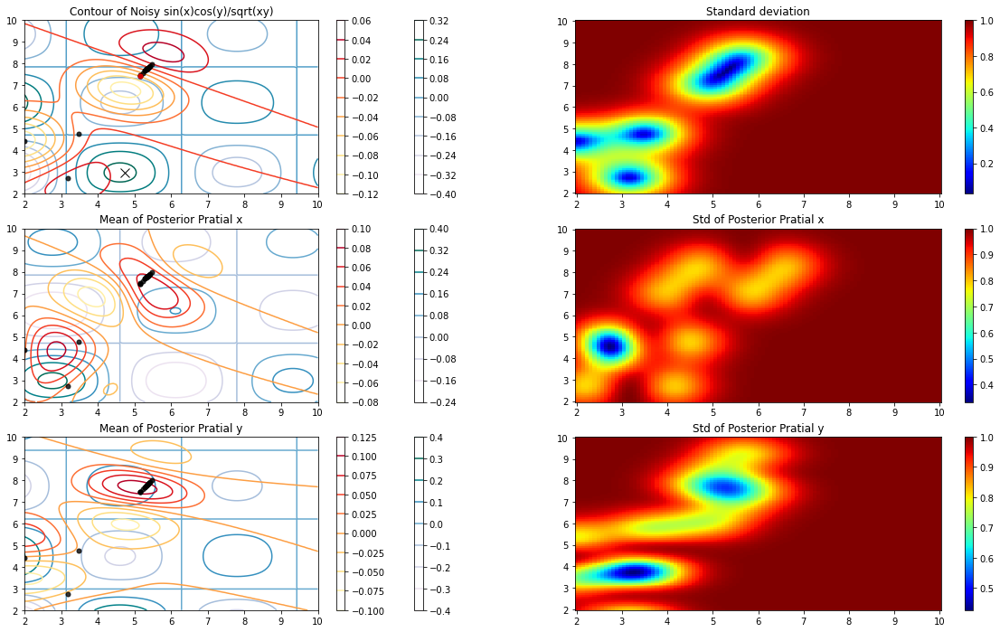

w:  [5.14426788 7.44129632]
f(w) [-0.06567856]
lr:  0.009765625


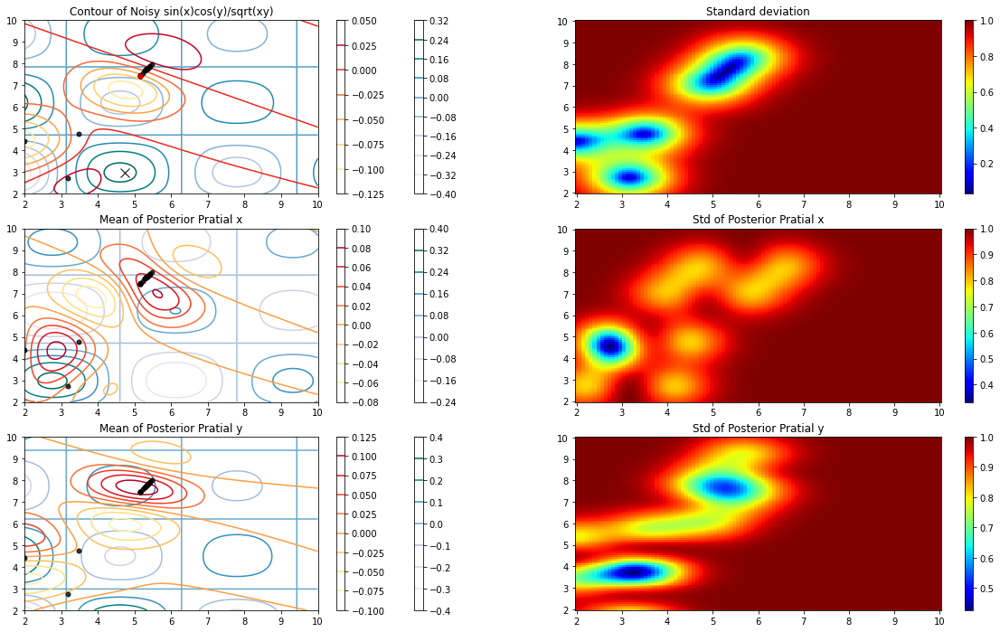

w:  [5.14418814 7.44116283]
f(w) [-0.06595128]
lr:  0.001220703125


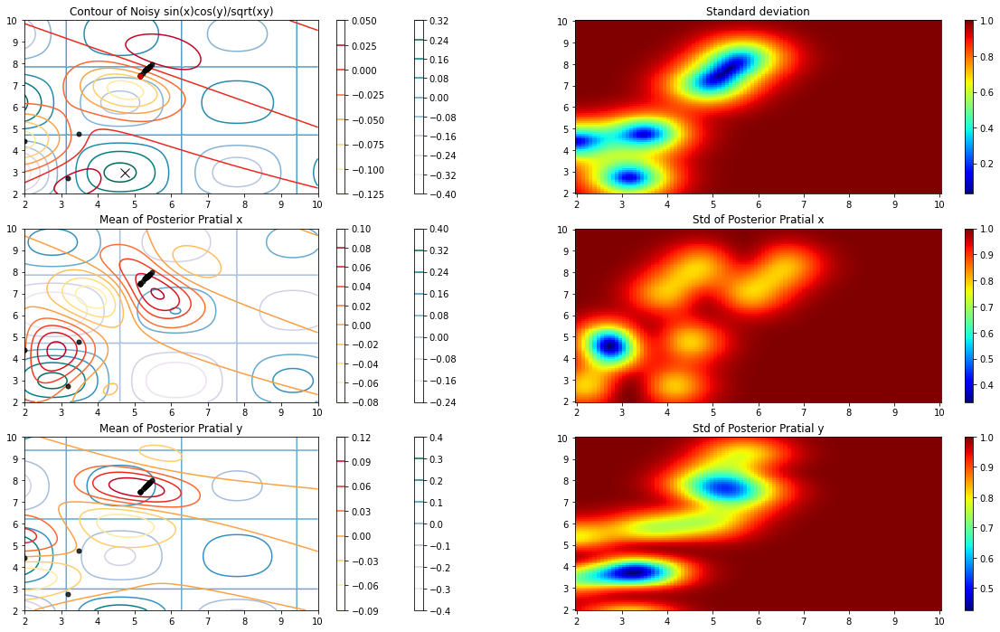

w:  [5.10285334 7.37196281]
f(w) [-0.05710749]
lr:  0.625


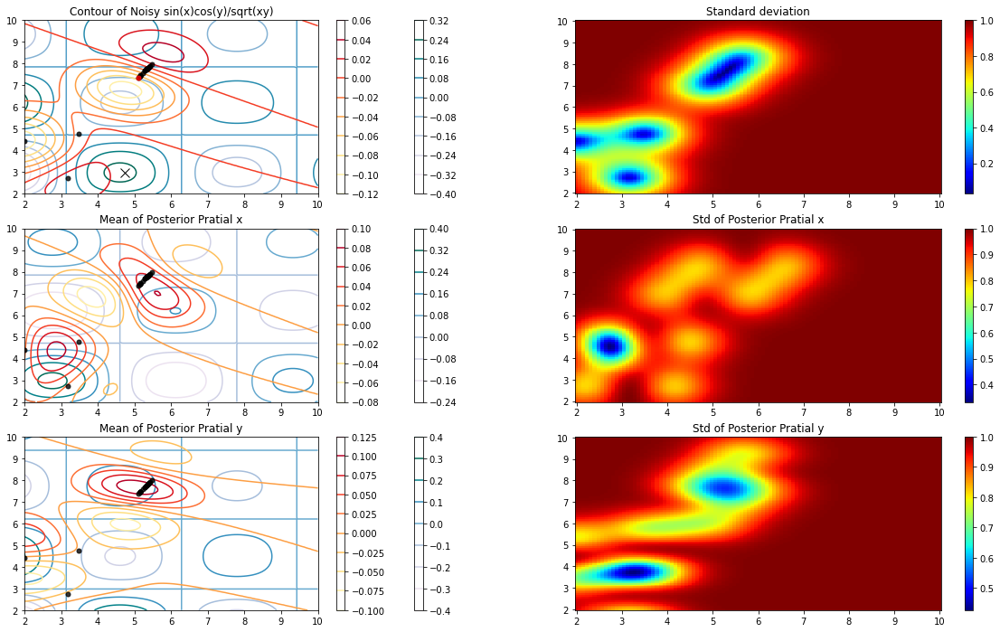

w:  [5.09809819 7.36400231]
f(w) [-0.09059689]
lr:  0.078125


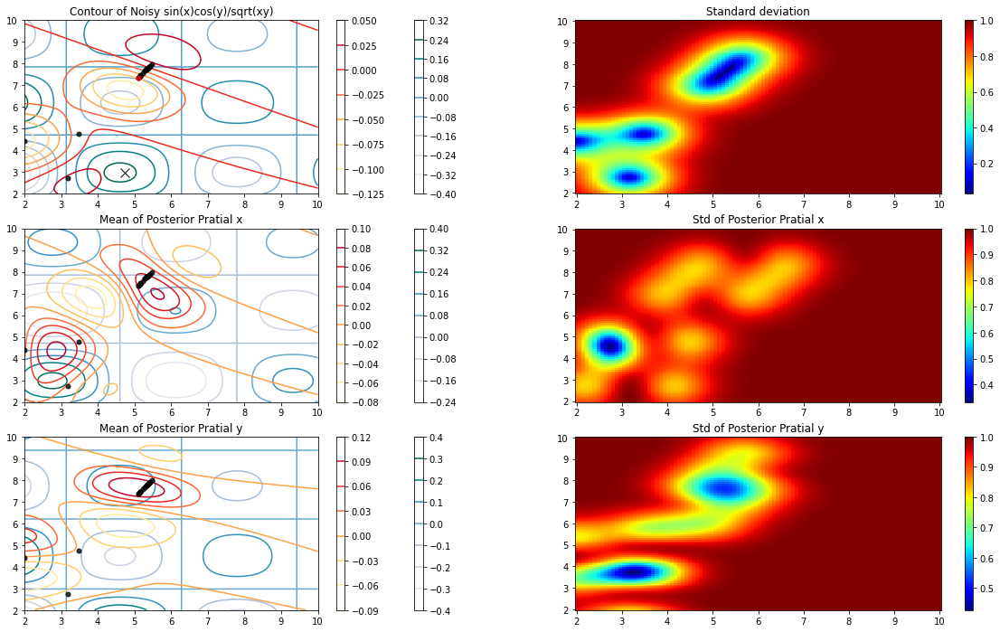

w:  [5.05917544 7.29884314]
f(w) [-0.08942691]
lr:  0.625


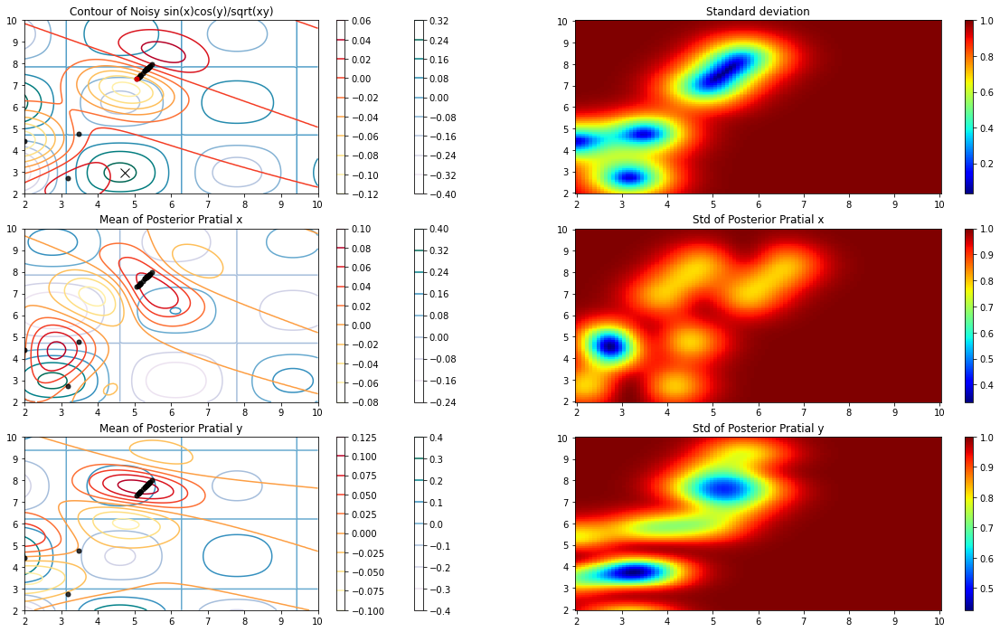

w:  [5.02547122 7.24242259]
f(w) [-0.0952955]
lr:  0.625


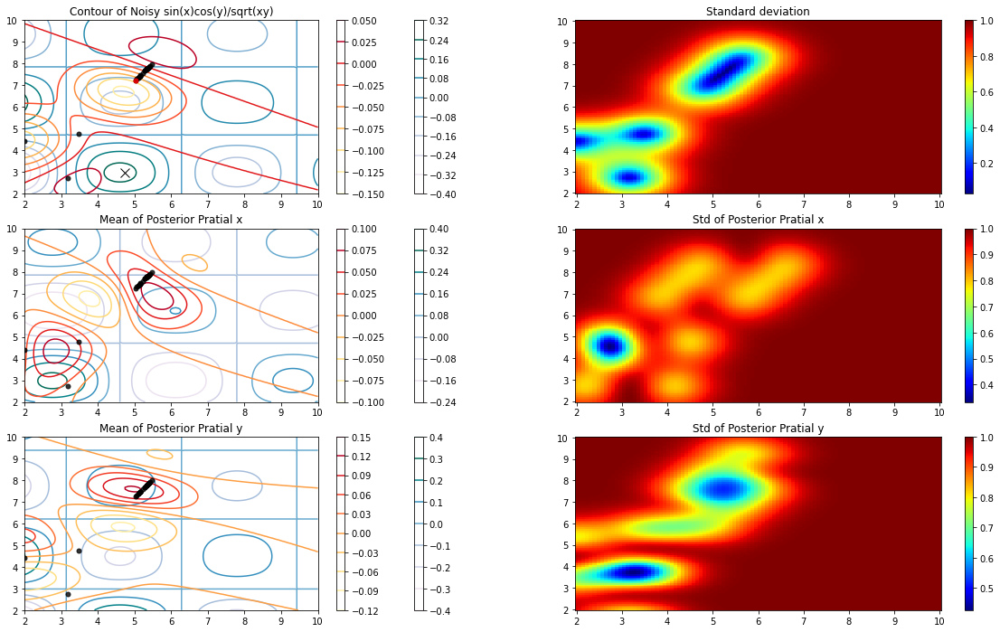

w:  [5.00614112 7.21006831]
f(w) [-0.08460167]
lr:  0.3125


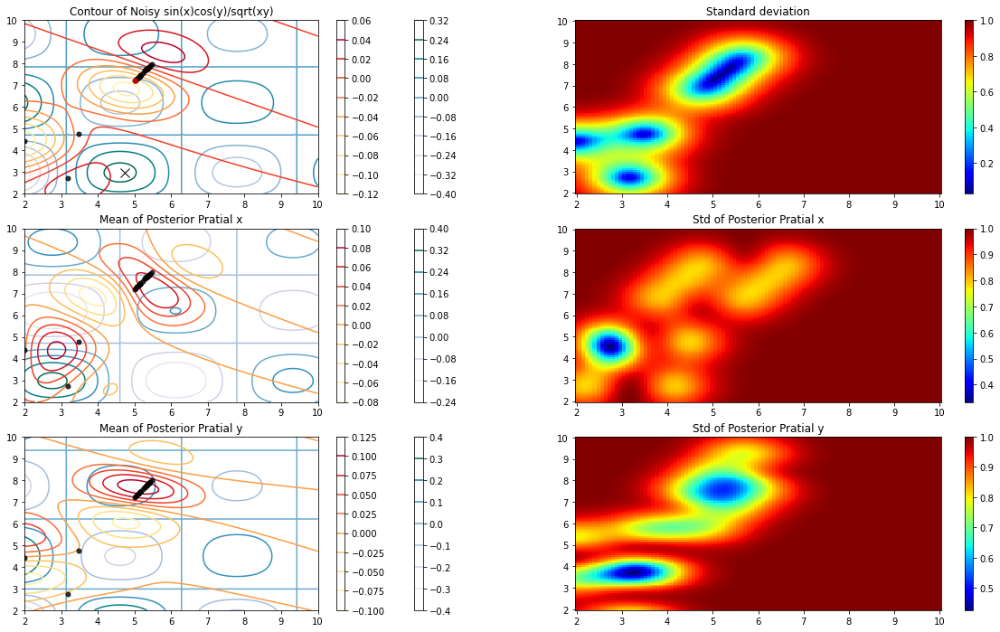

w:  [4.99909447 7.19827327]
f(w) [-0.09732096]
lr:  0.15625


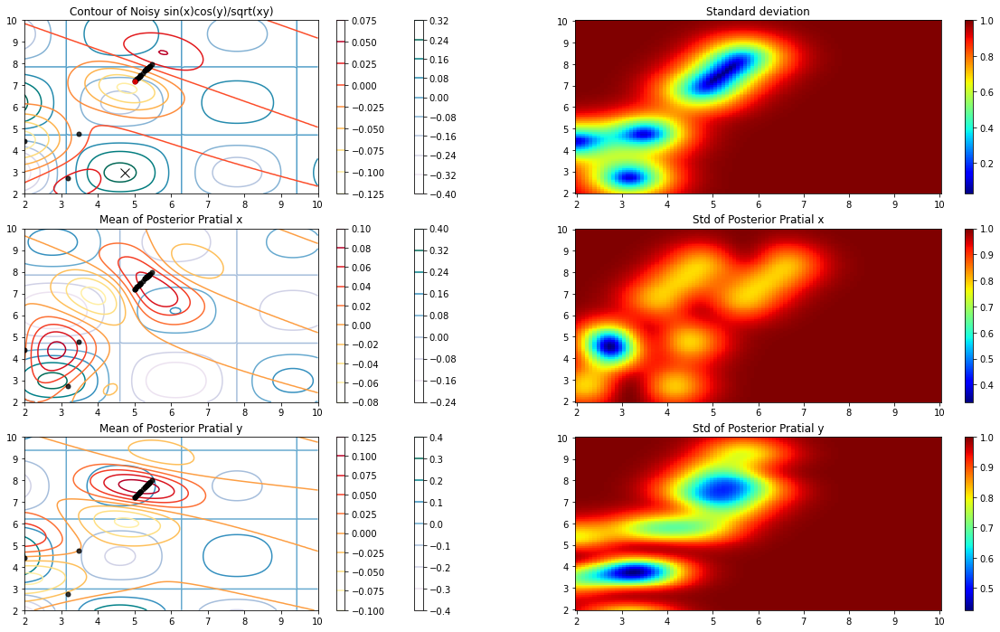

w:  [4.99868952 7.19759545]
f(w) [-0.10661502]
lr:  0.009765625


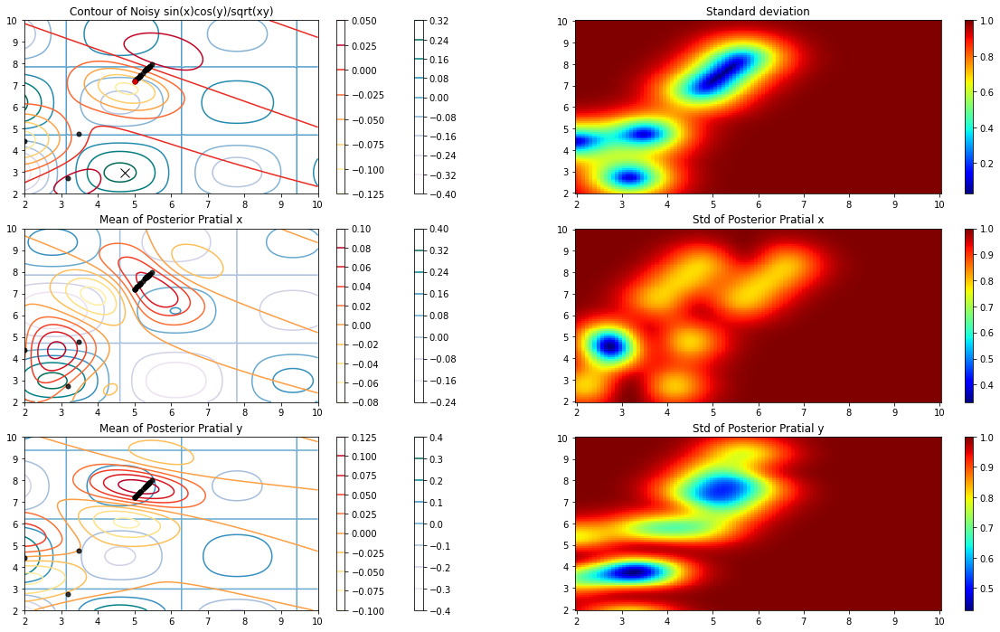

w:  [4.99208086 7.18653377]
f(w) [-0.10351595]
lr:  0.15625


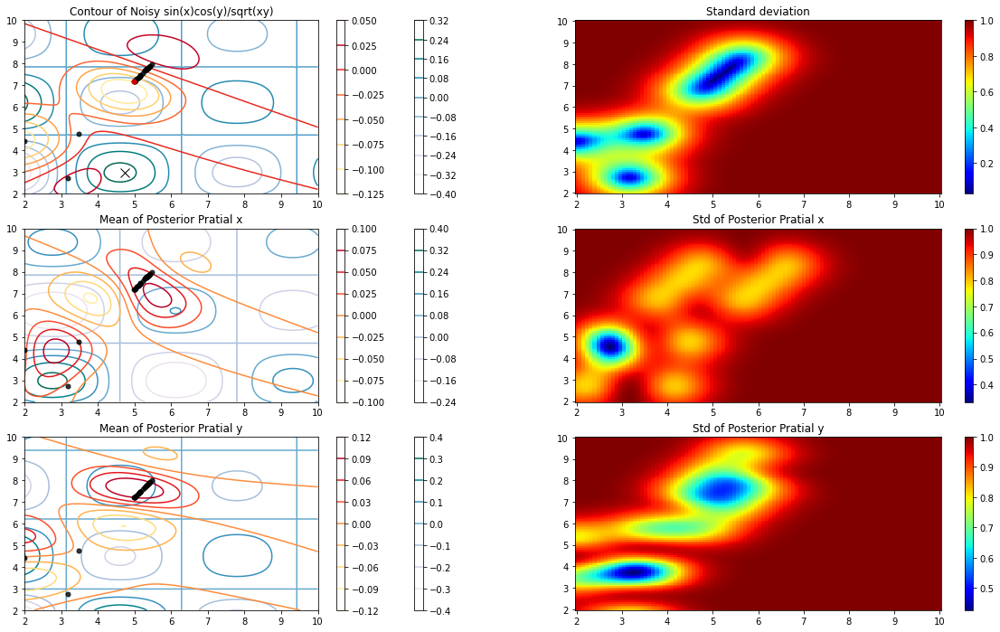

w:  [4.97543958 7.1586828 ]
f(w) [-0.09734644]
lr:  0.3125


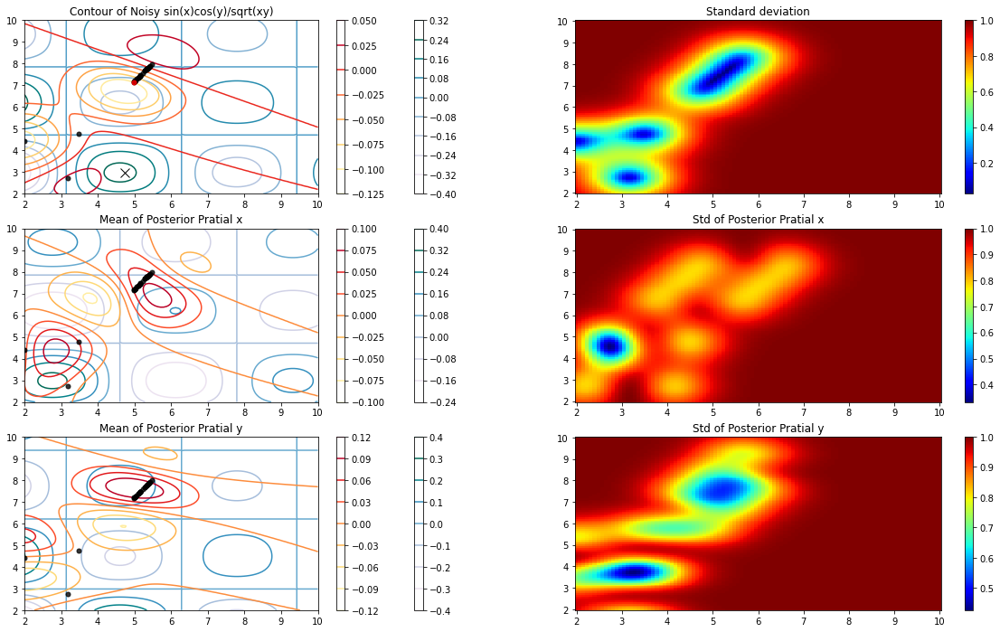

w:  [4.95956332 7.13211407]
f(w) [-0.11373918]
lr:  0.3125


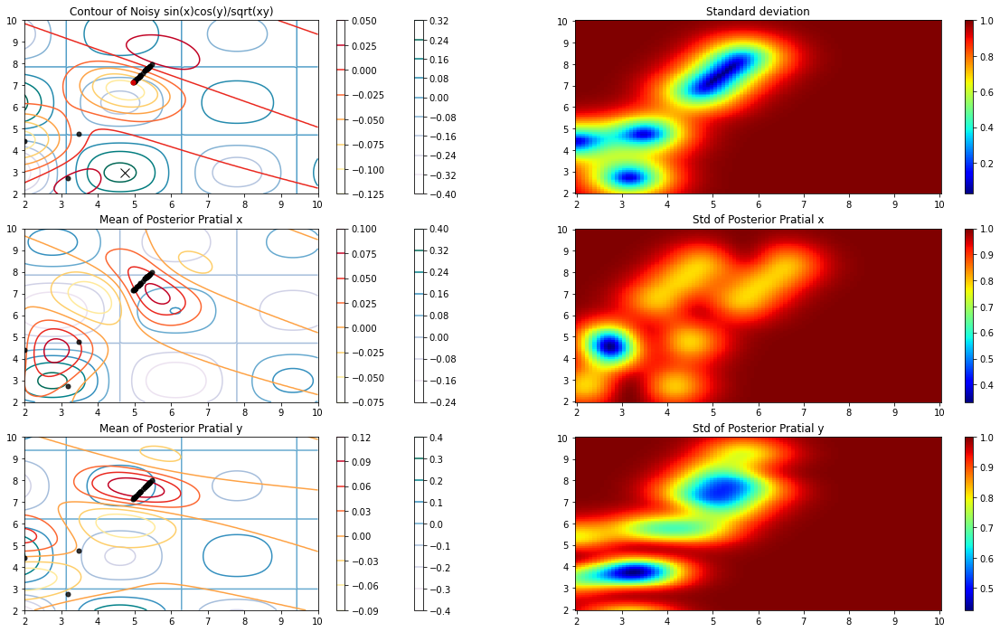

w:  [4.9528588  7.12089372]
f(w) [-0.11548197]
lr:  0.15625


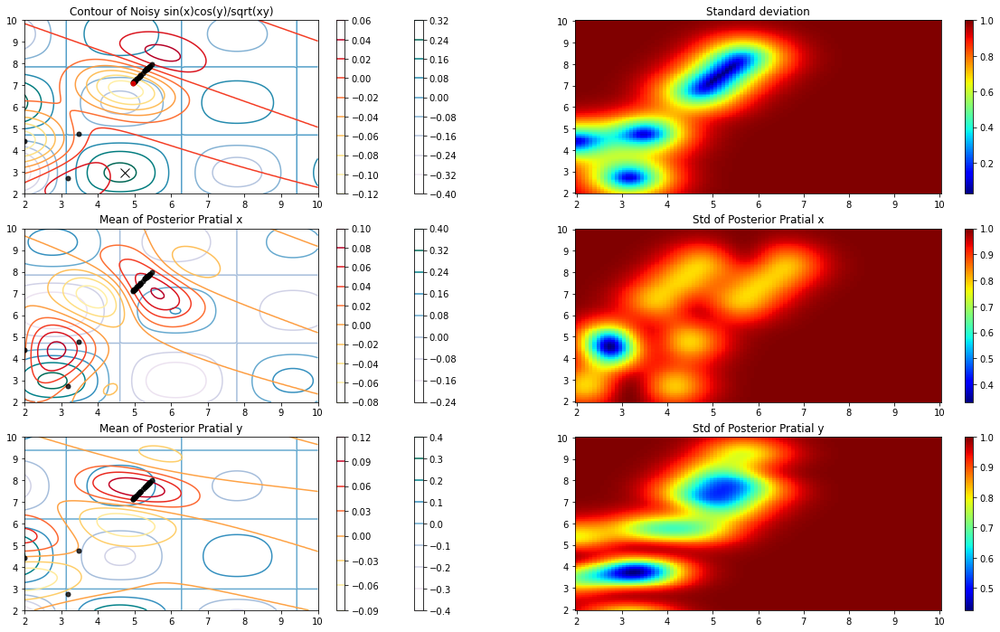

w:  [4.9036462  7.03853242]
f(w) [-0.12590801]
lr:  1.25


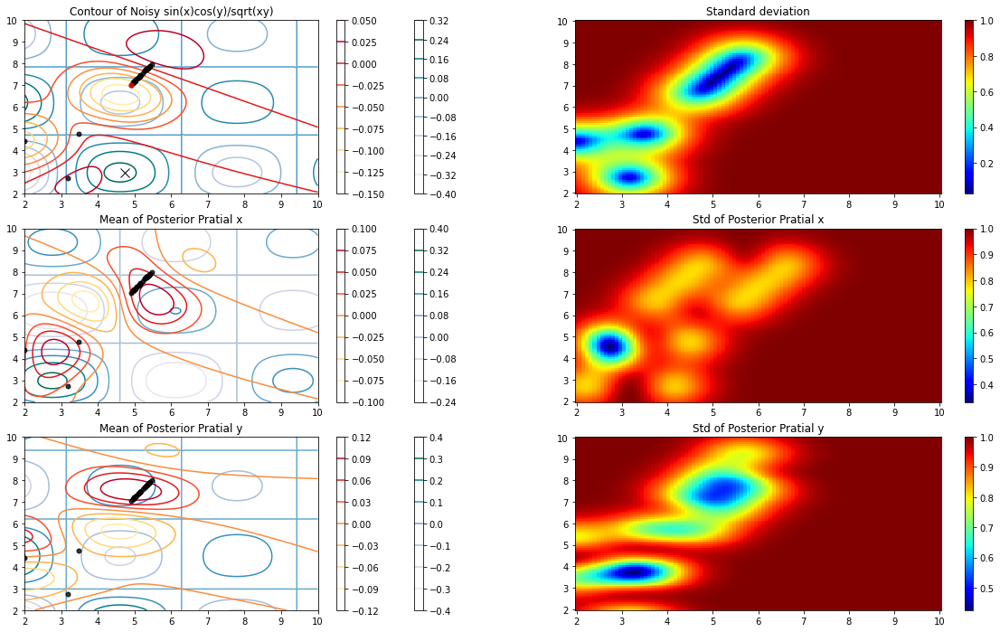

w:  [4.84024291 6.93249487]
f(w) [-0.15114506]
lr:  1.25


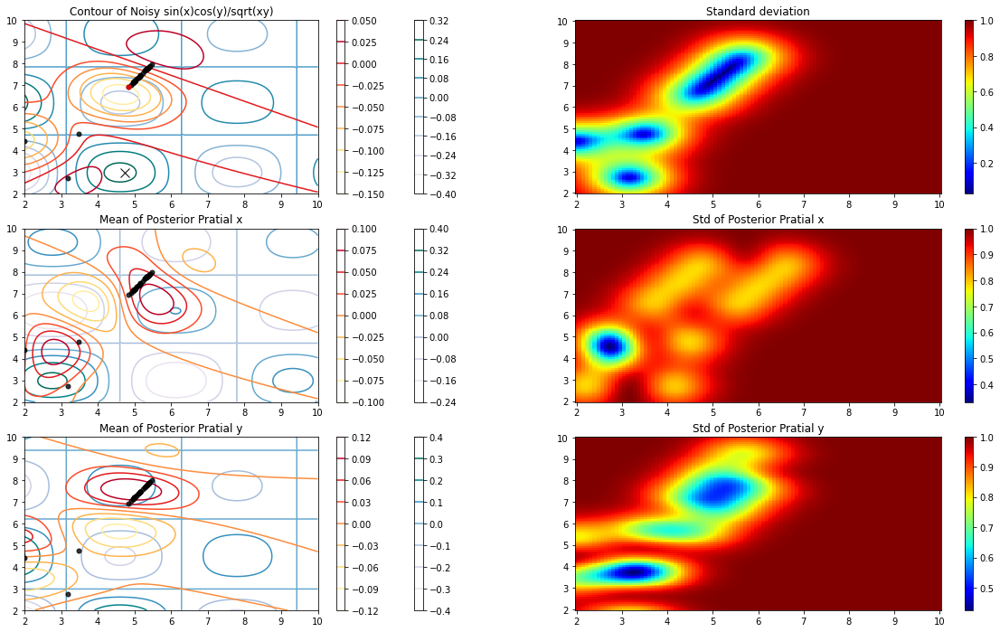

w:  [4.79002774 6.84857278]
f(w) [-0.14049389]
lr:  1.25


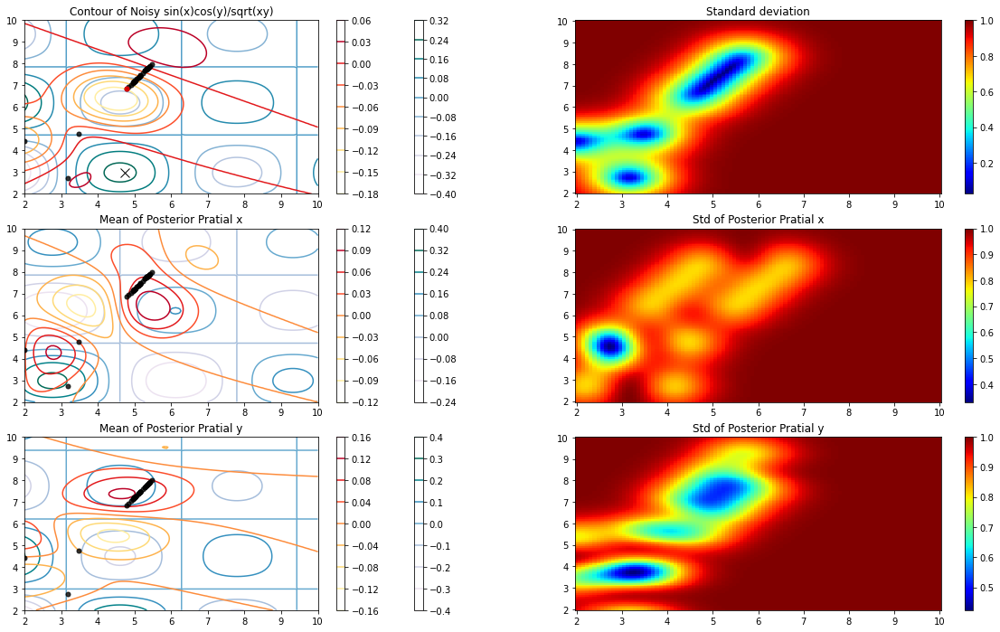

w:  [4.78147039 6.83429831]
f(w) [-0.14895283]
lr:  0.15625


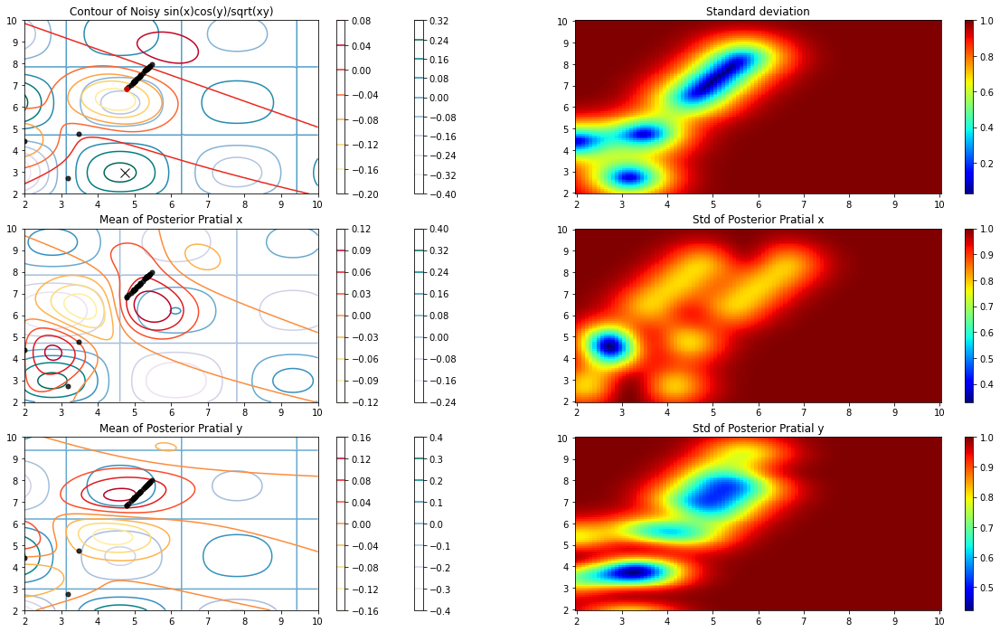

w:  [4.74482249 6.77318565]
f(w) [-0.16628946]
lr:  0.625


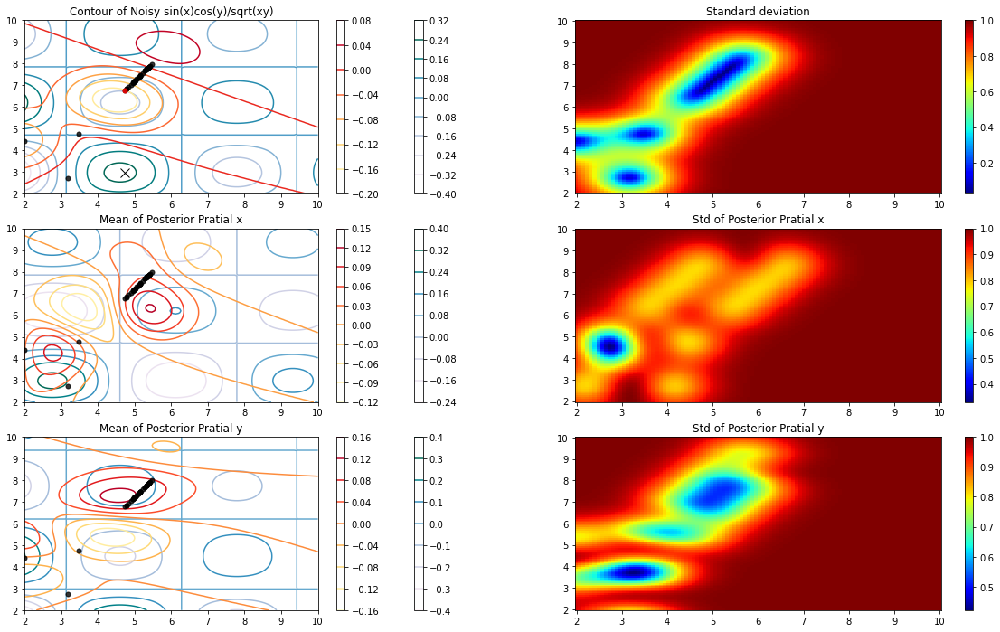

w:  [4.7267752  6.74312211]
f(w) [-0.16923992]
lr:  0.3125


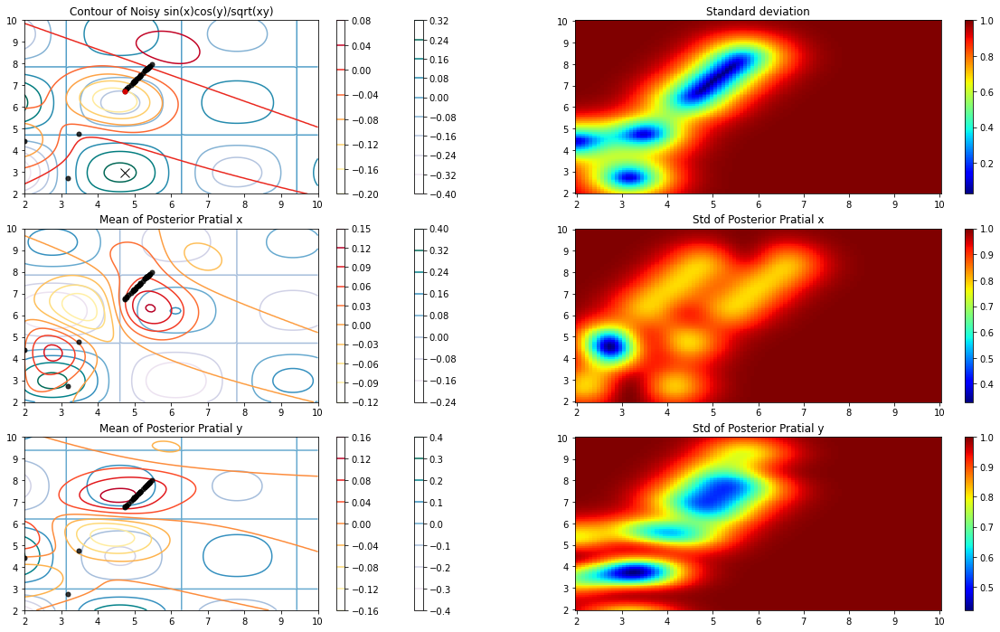

w:  [4.69233117 6.68575724]
f(w) [-0.16462366]
lr:  0.625


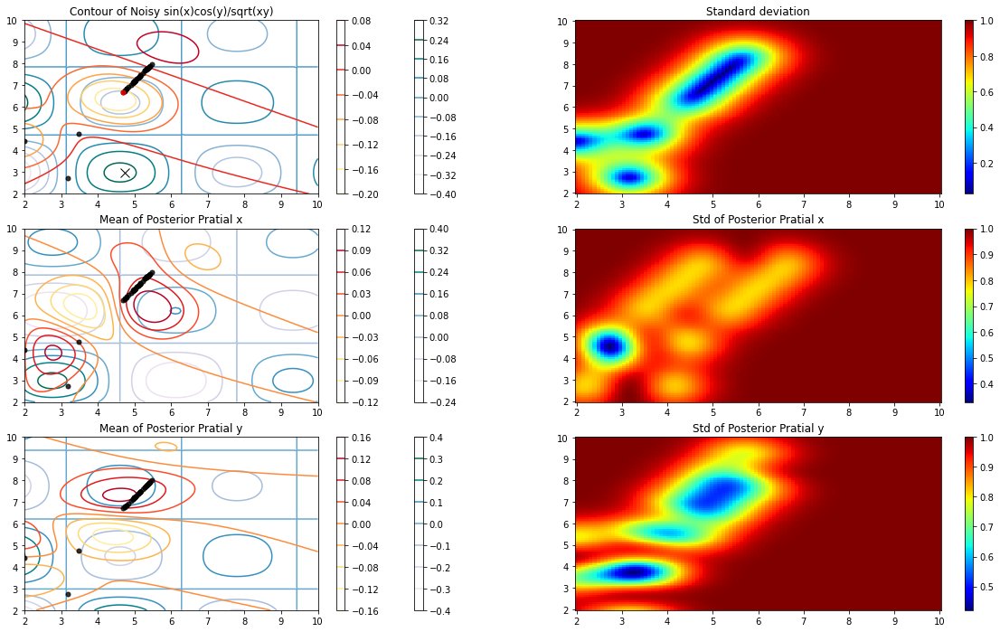

w:  [4.67793139 6.66176457]
f(w) [-0.16801586]
lr:  0.3125


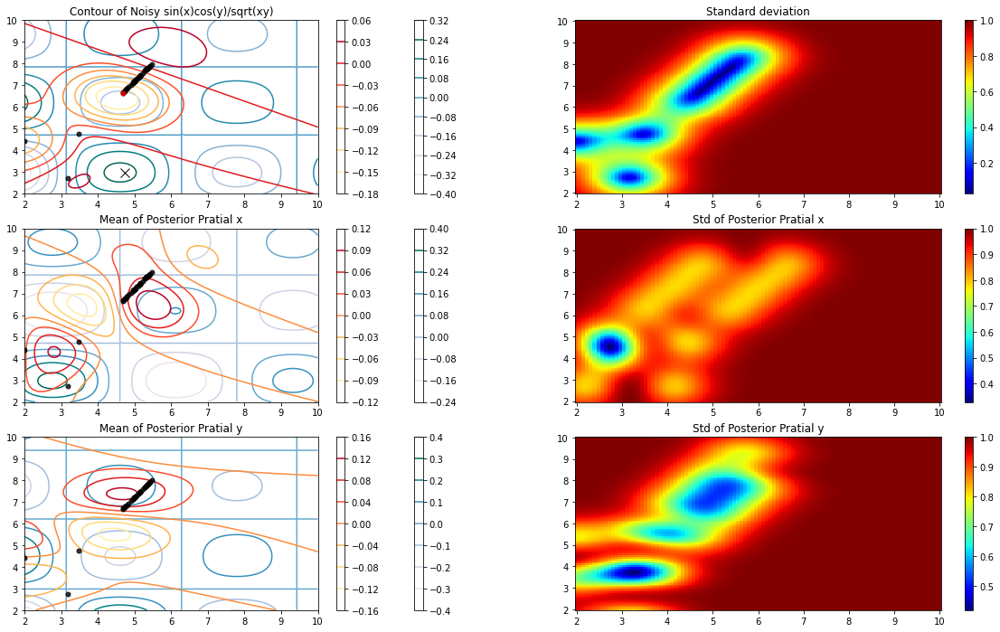

w:  [4.67243191 6.65257501]
f(w) [-0.17762205]
lr:  0.15625


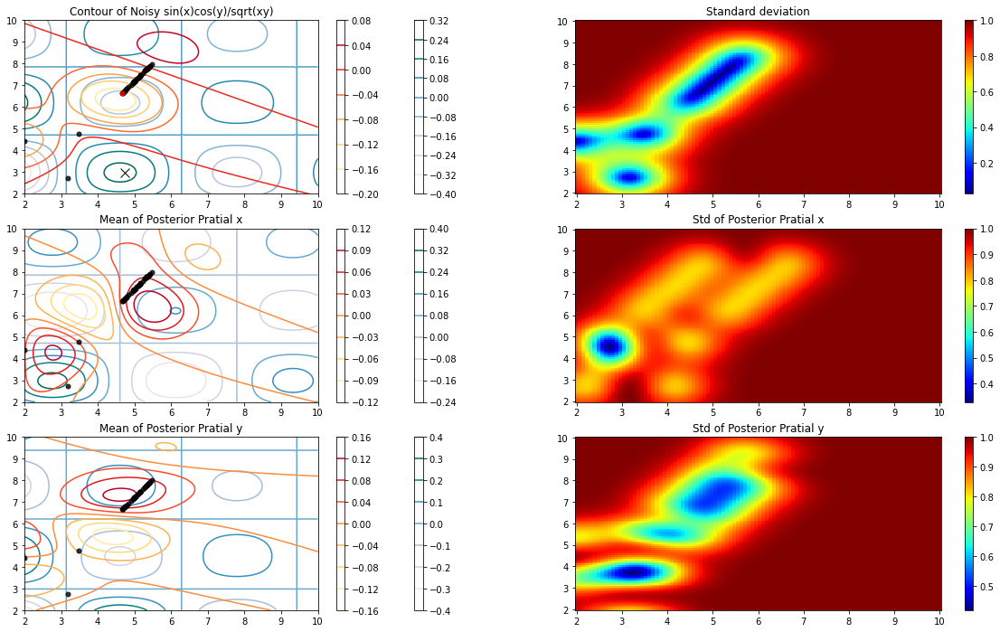

w:  [4.66586332 6.64163118]
f(w) [-0.16176376]
lr:  0.15625


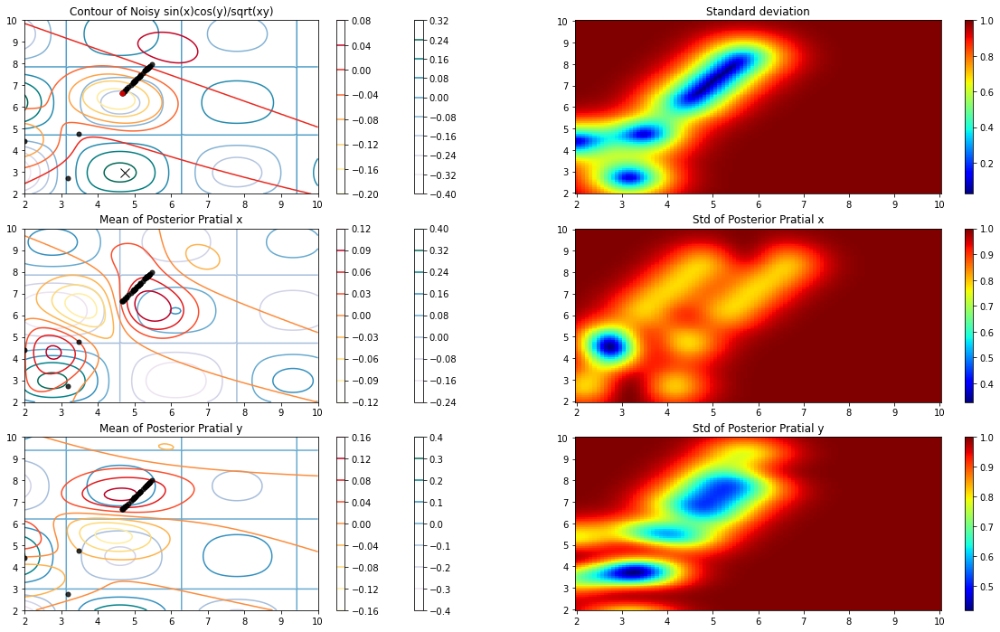

w:  [4.64220163 6.60218552]
f(w) [-0.17169018]
lr:  0.625


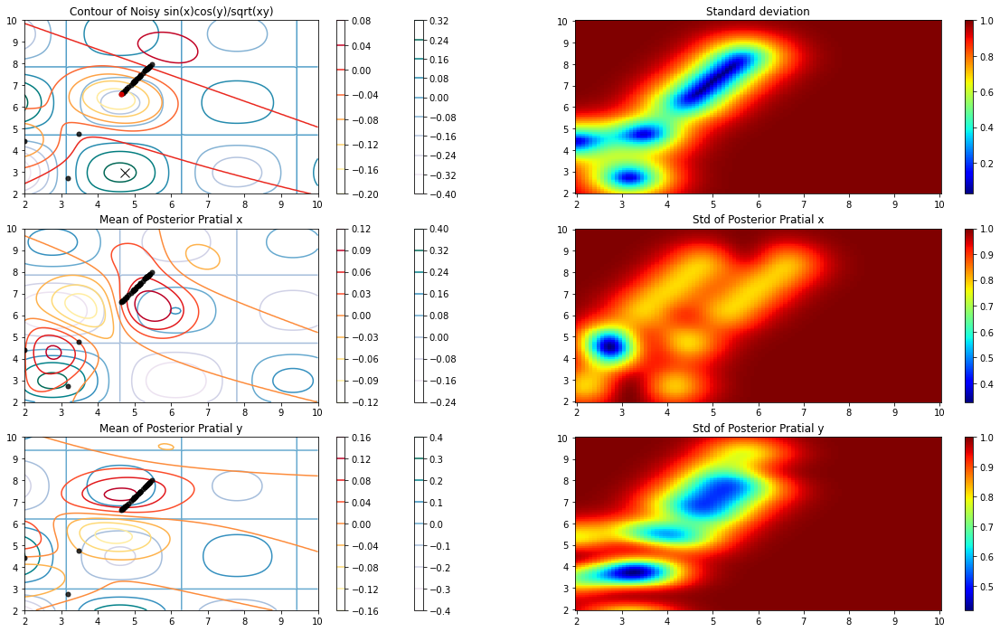

w:  [4.55931211 6.46418744]
f(w) [-0.1779488]
lr:  2.5


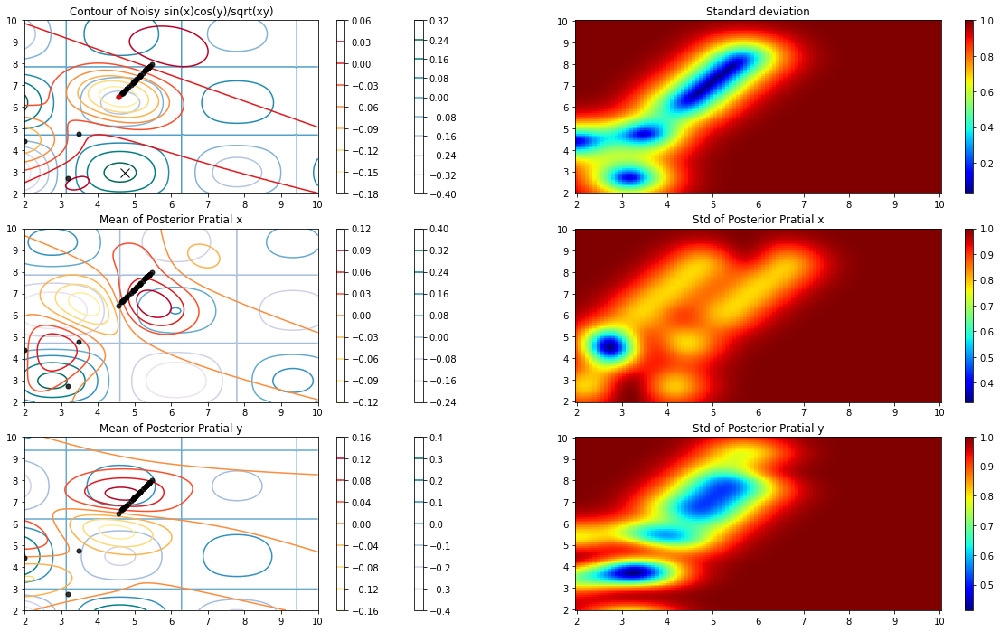

w:  [4.59410313 6.52926686]
f(w) [-0.17272568]
lr:  20


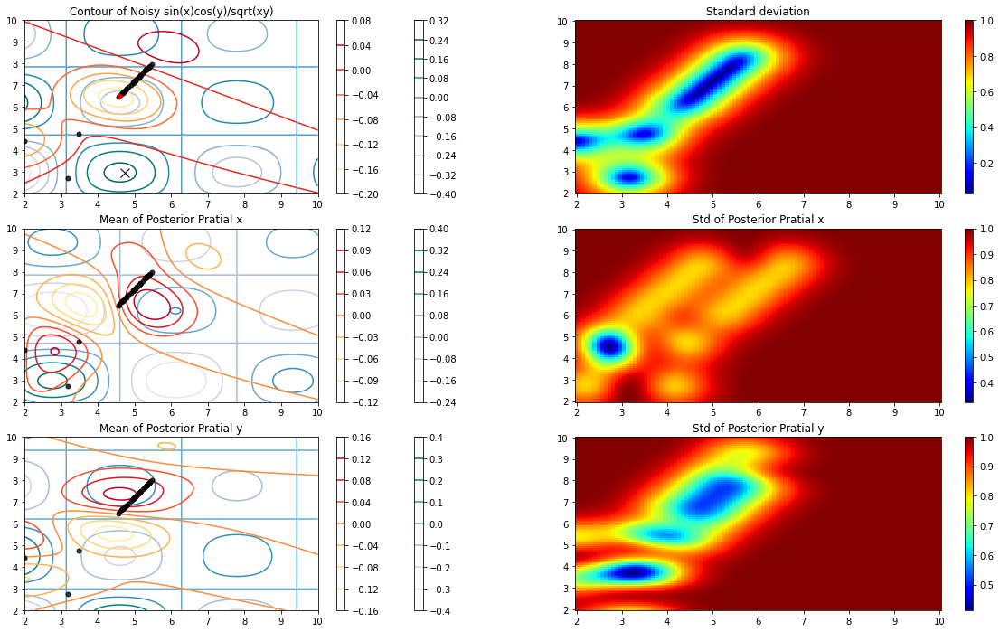

w:  [4.57989236 6.51295158]
f(w) [-0.18272566]
lr:  0.625


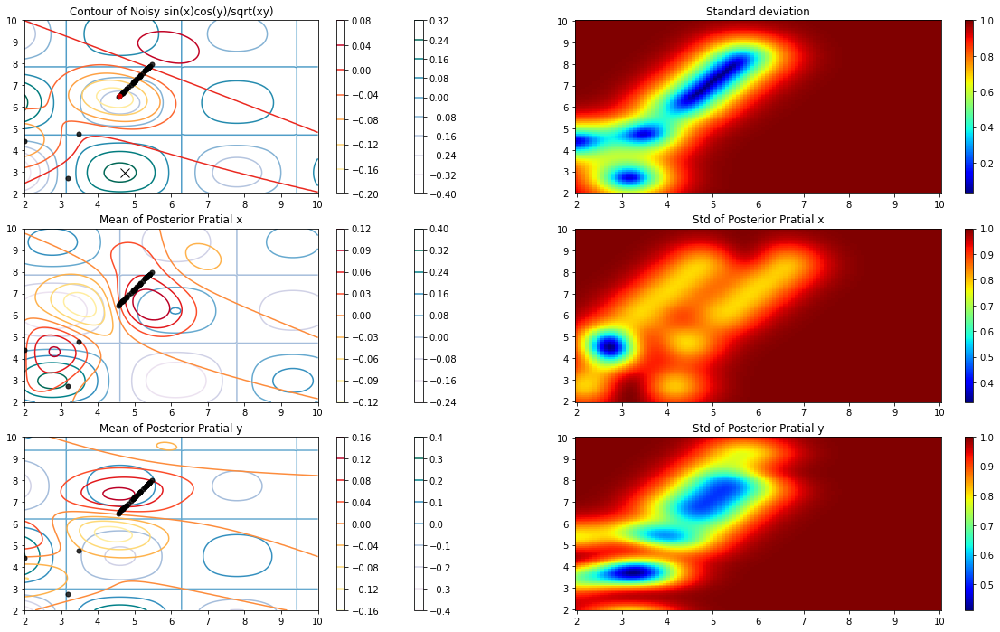

w:  [4.51598429 6.45202782]
f(w) [-0.18050557]
lr:  2.5


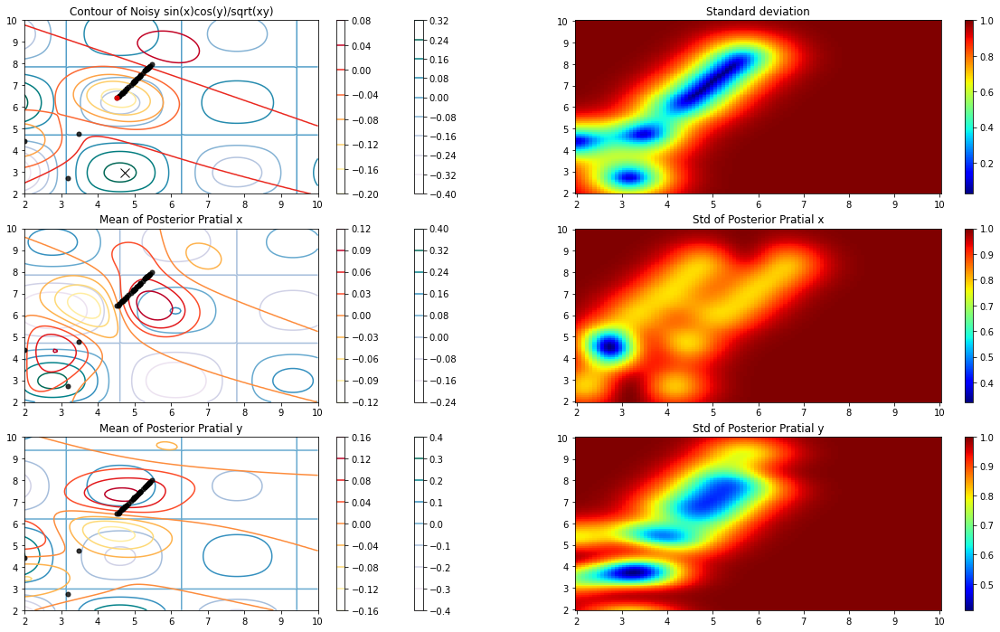

w:  [4.60690638 6.36134602]
f(w) [-0.18313914]
lr:  10.0


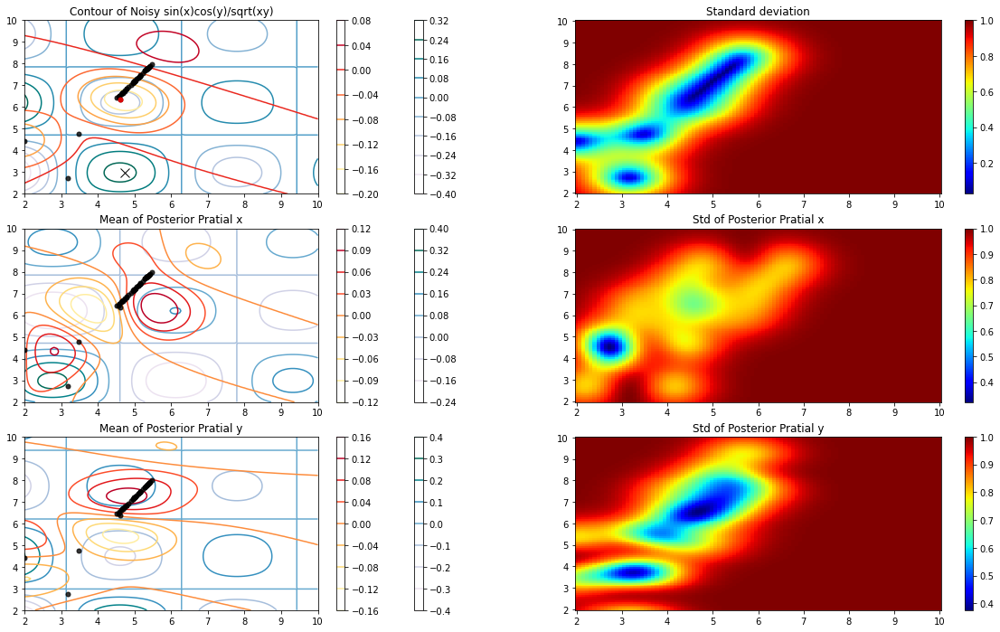

w:  [4.62830044 6.34889465]
f(w) [-0.17733976]
lr:  1.25


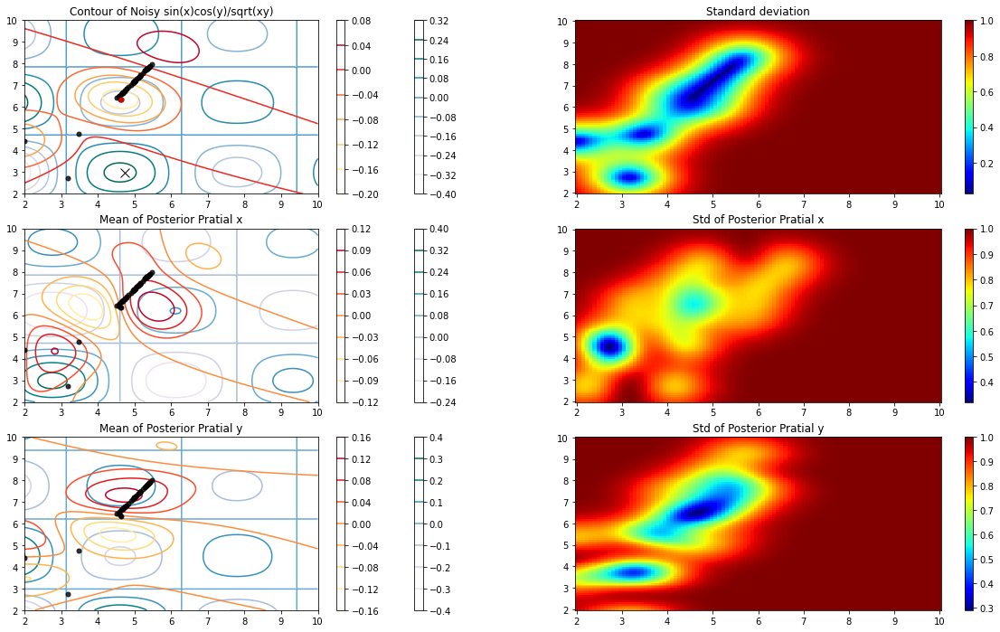

w:  [4.60630062 6.39050841]
f(w) [-0.17490833]
lr:  10.0


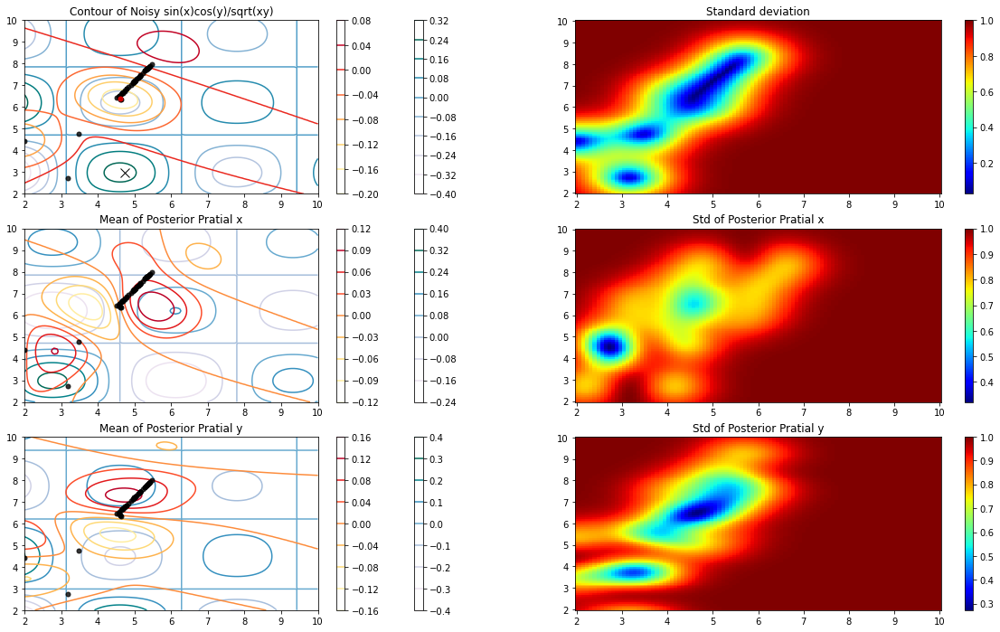

w:  [4.60633434 6.3846987 ]
f(w) [-0.17023685]
lr:  1.25


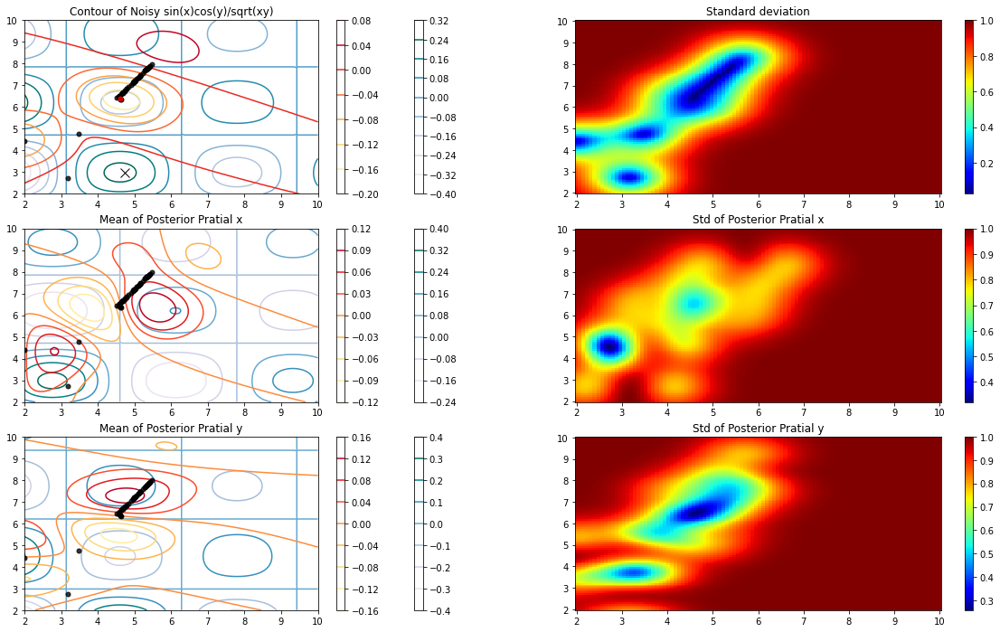

w:  [4.62514733 6.35898815]
f(w) [-0.19545945]
lr:  2.5


In [15]:
for i in range(n_iter):
    # posterior of GP given gp.X, gp.y
    x = mesh[:,0]
    y = mesh[:,1]

    mu, covar = gp.posterior(mesh)
    s = np.sqrt(np.diag(covar))
    mu = np.squeeze(mu)

    # posterior of GP derivative given gp.X, gp.y
    gp.set_p(0)
    mu_grad_1, covar_grad_1 = gp.posterior_grad(mesh)
    s_grad_1 = np.sqrt(np.diag(covar_grad_1))
    mu_grad_1 = np.squeeze(mu_grad_1)

    # partial x2
    gp.set_p(1)
    mu_grad_2, covar_grad_2 = gp.posterior_grad(mesh)
    s_grad_2 = np.sqrt(np.diag(covar_grad_2))
    mu_grad_2 = np.squeeze(mu_grad_2)

    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = pl.subplots(3, 2, figsize=(20, 12))

    # plot function
    im = ax2.pcolormesh(X1, X2, s.reshape(X1.shape), cmap="jet", shading='auto')
    fig.colorbar(im, ax=ax2)

    im1 = ax1.contour(X1, X2, (np.sin(x)*np.cos(y)/np.sqrt(x*y)).reshape(X1.shape), cmap="PuBuGn")
    im2 = ax1.contour(X1, X2, mu.reshape(X1.shape), cmap="YlOrRd")

    fig.colorbar(im1, ax=ax1)
    fig.colorbar(im2, ax=ax1)

    ax1.plot(gp.X[:, 0], gp.X[:, 1], "ok", markersize=5, alpha=0.8)
    ax1.plot(argmin[0], argmin[1], "xk", markersize=10)
    ax1.plot(w[0], w[1], "ro", markersize=5, alpha=0.8)
    
    ax1.title.set_text("Contour of Noisy sin(x)cos(y)/sqrt(xy)")
    ax2.title.set_text("Standard deviation")

    # plot derivative
    p1 = y*np.cos(y)* ( (2*x*np.cos(x)) - np.sin(x) ) / (2* (x*y)**(3/2))
    p2 = - x*np.sin(x)* ( (2*y*np.sin(y)) + np.cos(y) ) / (2* (x*y)**(3/2))

    im = ax4.pcolormesh(X1, X2, s_grad_1.reshape(X1.shape), cmap="jet", shading='auto')
    fig.colorbar(im, ax=ax4)
    im1 = ax3.contour(X1, X2, p1.reshape(X1.shape), cmap="PuBuGn")
    im2 = ax3.contour(X1, X2, mu_grad_1.reshape(X1.shape), cmap="YlOrRd")

    fig.colorbar(im1, ax=ax3)
    fig.colorbar(im2, ax=ax3)

    ax3.plot(gp.X[:, 0], gp.X[:, 1], "ok", markersize=5, alpha=0.8)
    ax3.title.set_text("Mean of Posterior Pratial x")
    ax4.title.set_text("Std of Posterior Pratial x")

    im3 = ax6.pcolormesh(X1, X2, s_grad_2.reshape(X1.shape), cmap="jet", shading='auto')
    fig.colorbar(im3, ax=ax6)
    im4 = ax5.contour(X1, X2, p2.reshape(X1.shape), cmap="PuBuGn")
    im5 = ax5.contour(X1, X2, mu_grad_2.reshape(X1.shape), cmap="YlOrRd")

    fig.colorbar(im4, ax=ax5)
    fig.colorbar(im5, ax=ax5)

    ax5.plot(gp.X[:, 0], gp.X[:, 1], "ok", markersize=5, alpha=0.8)
    ax5.title.set_text("Mean of Posterior Pratial y")
    ax6.title.set_text("Std of Posterior Pratial y")
    
    # Saving all the plots in 2D_Plots (need to creat a folder) 
    filename = 'SinCos_noisy' + str(i) + '.png'
    pl.savefig('2D_Plots/' + filename)
    pl.show()
    
    
    # gradient ascent to sample the next point
    gradient = grad(gp, w)
    desc = -gradient
    
    # automatically choose the learning rate
    lr = lr_init
    while f(w + lr*gradient) > f(w) + alpha*lr*np.dot(desc, gradient):
        # while condition not satisfied, divide the learning rate by two
        lr = 0.5 * lr
    
    w = np.clip(w + lr * desc, -2, 10) # gp.SearchSpace
    print('w: ', w)
    print('f(w)', f(w))
    print('lr: ', lr)
    history.append( f(w) )
    history_lr.append(lr)
    gp.add_data(w.reshape(1, -1), f(w))
    gp.fit()

In [16]:
w, f(w)

(array([4.62514733, 6.35898815]), array([-0.17590821]))

In [17]:
# Creates the .gif from the saved plots for the 2D_Plots dir.
filenames = []
for i in range(n_iter):
    filename = 'SinCos_noisy' + str(i) + '.png'
    filenames.append(filename)

frames=[]
for filename in filenames:
    frames.append(imageio.imread('2D_Plots/' + filename))
exportname = 'sincos2d_gd_v2.gif'

kargs = { 'duration': 0.5 }
imageio.mimsave(exportname, frames, 'GIF', **kargs)

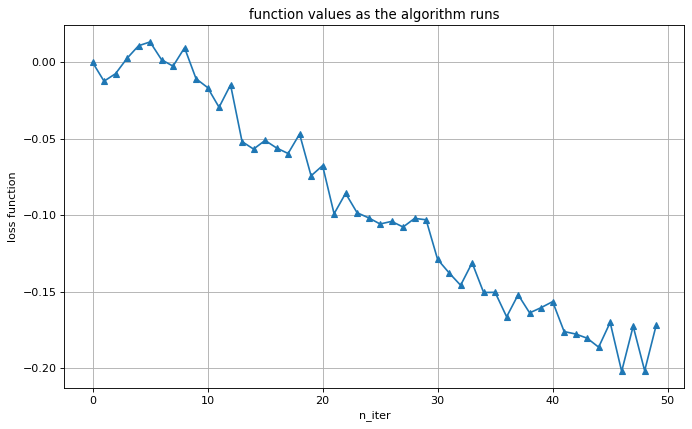

In [18]:
pl.figure(figsize=(10, 6), dpi=80)
pl.plot(np.squeeze(history), "-^")
pl.title("function values as the algorithm runs")
pl.xlabel("n_iter")
pl.ylabel("loss function")
pl.grid(True)

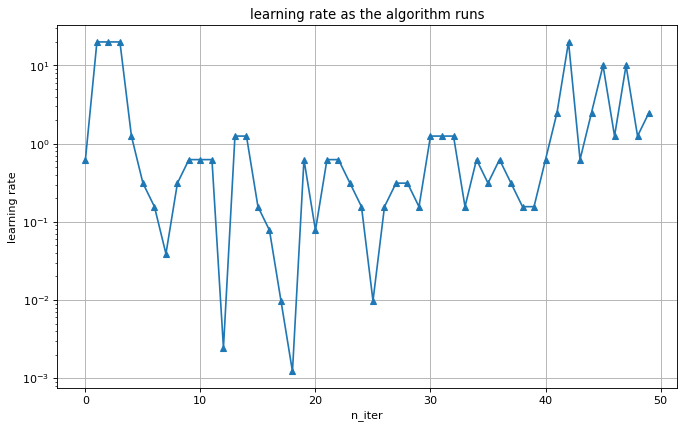

In [20]:
pl.figure(figsize=(10, 6), dpi=80)
pl.plot(history_lr, "-^")
pl.title("learning rate as the algorithm runs")
pl.xlabel("n_iter")
pl.ylabel("learning rate")
pl.yscale("log")
pl.grid(True)